# ANÁLISE DESCRITIVA MICRODADOS ENEM 2019

Esse notebook tem como objetivo investigar as características socioeconômicas dos **melhores 5000 vestibulandos paulistas** no ENEM 2019.

![Alunos Etapa](https://alfredodantas.com.br/site/wp-content/uploads/2019/10/enem-2019.jpg)



##### por Felipe Gabriel

In [1]:
#importa pacotes de manipulação
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist

#importa pacotes de machine learning
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

#visualizações
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings('ignore')

In [2]:
#habilita visualizar todas colunas
pd.set_option("display.max_columns", None)

In [3]:
#carrega os dados originais, 500k de linhas por vez
chunk = pd.read_csv('DADOS/MICRODADOS_ENEM_2019.csv', sep=';', encoding='ISO-8859-1', chunksize=500000)
enem = pd.concat(chunk)

In [4]:
enem.head(5)

,NU_INSCRICAO,NU_ANO,CO_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,CO_UF_RESIDENCIA,SG_UF_RESIDENCIA,NU_IDADE,TP_SEXO,TP_ESTADO_CIVIL,TP_COR_RACA,TP_NACIONALIDADE,CO_MUNICIPIO_NASCIMENTO,NO_MUNICIPIO_NASCIMENTO,CO_UF_NASCIMENTO,SG_UF_NASCIMENTO,TP_ST_CONCLUSAO,TP_ANO_CONCLUIU,TP_ESCOLA,TP_ENSINO,IN_TREINEIRO,CO_ESCOLA,CO_MUNICIPIO_ESC,NO_MUNICIPIO_ESC,CO_UF_ESC,SG_UF_ESC,TP_DEPENDENCIA_ADM_ESC,TP_LOCALIZACAO_ESC,TP_SIT_FUNC_ESC,IN_BAIXA_VISAO,IN_CEGUEIRA,IN_SURDEZ,IN_DEFICIENCIA_AUDITIVA,IN_SURDO_CEGUEIRA,IN_DEFICIENCIA_FISICA,IN_DEFICIENCIA_MENTAL,IN_DEFICIT_ATENCAO,IN_DISLEXIA,IN_DISCALCULIA,IN_AUTISMO,IN_VISAO_MONOCULAR,IN_OUTRA_DEF,IN_GESTANTE,IN_LACTANTE,IN_IDOSO,IN_ESTUDA_CLASSE_HOSPITALAR,IN_SEM_RECURSO,IN_BRAILLE,IN_AMPLIADA_24,IN_AMPLIADA_18,IN_LEDOR,IN_ACESSO,IN_TRANSCRICAO,IN_LIBRAS,IN_TEMPO_ADICIONAL,IN_LEITURA_LABIAL,IN_MESA_CADEIRA_RODAS,IN_MESA_CADEIRA_SEPARADA,IN_APOIO_PERNA,IN_GUIA_INTERPRETE,IN_COMPUTADOR,IN_CADEIRA_ESPECIAL,IN_CADEIRA_CANHOTO,IN_CADEIRA_ACOLCHOADA,IN_PROVA_DEITADO,IN_MOBILIARIO_OBESO,IN_LAMINA_OVERLAY,IN_PROTETOR_AURICULAR,IN_MEDIDOR_GLICOSE,IN_MAQUINA_BRAILE,IN_SOROBAN,IN_MARCA_PASSO,IN_SONDA,IN_MEDICAMENTOS,IN_SALA_INDIVIDUAL,IN_SALA_ESPECIAL,IN_SALA_ACOMPANHANTE,IN_MOBILIARIO_ESPECIFICO,IN_MATERIAL_ESPECIFICO,IN_NOME_SOCIAL,CO_MUNICIPIO_PROVA,NO_MUNICIPIO_PROVA,CO_UF_PROVA,SG_UF_PROVA,TP_PRESENCA_CN,TP_PRESENCA_CH,TP_PRESENCA_LC,TP_PRESENCA_MT,CO_PROVA_CN,CO_PROVA_CH,CO_PROVA_LC,CO_PROVA_MT,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,TX_RESPOSTAS_CN,TX_RESPOSTAS_CH,TX_RESPOSTAS_LC,TX_RESPOSTAS_MT,TP_LINGUA,TX_GABARITO_CN,TX_GABARITO_CH,TX_GABARITO_LC,TX_GABARITO_MT,TP_STATUS_REDACAO,NU_NOTA_COMP1,NU_NOTA_COMP2,NU_NOTA_COMP3,NU_NOTA_COMP4,NU_NOTA_COMP5,NU_NOTA_REDACAO,Q001,Q002,Q003,Q004,Q005,Q006,Q007,Q008,Q009,Q010,Q011,Q012,Q013,Q014,Q015,Q016,Q017,Q018,Q019,Q020,Q021,Q022,Q023,Q024,Q025
0,190001595656,2019,3552205,Sorocaba,35,SP,36.0,M,1,3,1,2914802.0,Itabuna,29.0,BA,1,11,1,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3552205,Sorocaba,35,SP,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,B,B,A,A,2,A,A,B,C,A,A,B,A,A,A,A,A,A,A,A,A,C,A,C,B
1,190001421546,2019,2910800,Feira de Santana,29,BA,23.0,M,1,1,1,2910800.0,Feira de Santana,29.0,BA,1,5,1,1.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2910800,Feira de Santana,29,BA,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C,E,B,B,4,C,A,B,C,A,A,B,A,A,A,A,A,A,B,A,A,E,A,A,B
2,190001133210,2019,2304400,Fortaleza,23,CE,39.0,F,1,3,1,2304400.0,Fortaleza,23.0,CE,1,13,1,1.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2304400,Fortaleza,23,CE,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,E,E,B,C,2,B,A,B,B,A,A,B,A,A,A,A,A,A,B,A,A,C,A,A,B
3,190001199383,2019,1721000,Palmas,17,TO,25.0,F,1,1,1,1721000.0,Palmas,17.0,TO,1,4,1,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1721000,Palmas,17,TO,1,1,1,1,504.0,510.0,513.0,516.0,483.8,503.6,537.3,392.0,BACCEEBEECDBEDDAEECDEDEADEBBCDBCAACADEEACCBBD,AECEDADAABAADBAADAEBACBAECCDAEADCDBBECCEDABCD,99999AAABEBBCCBDCAEECADBACAADAECCCDCCBAEBDEEEA...,DDBBBBCDCCDCAECCBBECDAEBADCD..CABCCECAEBDBBDA,1,BEEAAEBEEBADEADDADAEABCEDDDBCBCBCCACBCDADCCEB,EEBCEEDBADBBCBABCCADCEBACDBBACCACACBEADBBADCB,ADBBEDCABAABBCBCDAAECDDDBAAAECADECDCEBDEEAECBD...,BEDEEEAADBEBACABCDBABECECACADCBDCCEDCDABECDDD,1.0,120.0,120.0,120.0,100.0,0.0,460.0,C,E,B,D,4,E,A,C,C,A,B,B,A,B,A,A,A,A,C,A,B,D,A,B,B
4,190001237802,2019,3118601,Contagem,31,MG,22.0,F,1,1,1,3118601.0,Contagem,31.0,MG,1,4,1,1.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0

In [5]:
enem.shape

(5095270, 136)

## Manipulação dos dados

![gif toy story.gif](https://media.giphy.com/media/xT9C25UNTwfZuk85WP/giphy.gif)

#### SELECIONANDO OS DADOS QUE QUEREMOS TRABALHAR

Para a análise que será realizada neste estudo não iremos utilizar todas as 136 variáveis, iremos filtra-las. Abaixo segue dicionário explicativo das variáveis selecionadas (conforme arquivo disponibilizado junto com os microdados do Enem):

- NO_MUNICIPIO_RESIDENCIA: Nome do município de residência
- SG_UF_RESIDENCIA: Sigla da Unidade da Federação de residência
- NU_IDADE: Idade
- TP_SEXO: Sexo
 - M: Masculino
 - F: Feminino 
- TP_COR_RACA: Cor/raça	
 - 0: Não declarado
 - 1: Branca
 - 2: Preta
 - 3: Parda
 - 4: Amarela
 - 5: Indígena
- TP_ESCOLA: Tipo de escola do Ensino Médio	
 - 1: Não Respondeu
 - 2: Pública
 - 3: Privada
 - 4: Exterior
- NU_NOTA_CN: Nota da prova de Ciências da Natureza
- NU_NOTA_CH: Nota da prova de Ciências Humanas
- NU_NOTA_LC: Nota da prova de Linguagens e Códigos
- NU_NOTA_MT: Nota da prova de Matemática
- NU_NOTA_REDACAO: Nota da prova de redação
- Q001: Até que série seu pai, ou o homem responsável por você, estudou?
 - A: Nunca estudou.
 - B: Não completou a 4ª série/5º ano do Ensino Fundamental.
 - C: Completou a 4ª série/5º ano, mas não completou a 8ª série/9º ano do Ensino Fundamental.
 - D: Completou a 8ª série/9º ano do Ensino Fundamental, mas não completou o Ensino Médio.
 - E: Completou o Ensino Médio, mas não completou a Faculdade.
 - F: Completou a Faculdade, mas não completou a Pós-graduação.
 - G: Completou a Pós-graduação.
 - H: Não sei.
- Q002: Até que série sua mãe, ou a mulher responsável por você, estudou?	
 - A: Nunca estudou.
 - B: Não completou a 4ª série/5º ano do Ensino Fundamental.
 - C: Completou a 4ª série/5º ano, mas não completou a 8ª série/9º ano do Ensino Fundamental.
 - D: Completou a 8ª série/9º ano do Ensino Fundamental, mas não completou o Ensino Médio.
 - E: Completou o Ensino Médio, mas não completou a Faculdade.
 - F: Completou a Faculdade, mas não completou a Pós-graduação.
 - G: Completou a Pós-graduação.
 - H: Não sei.
- Q006: Qual é a renda mensal de sua família? (Some a sua renda com a dos seus familiares.)	
 - A: Nenhuma renda.
 - B: Até RS 998,00.
 - C: De RS 998,01 até RS 1.497,00.
 - D: De RS 1.497,01 até RS 1.996,00.
 - E: De RS 1.996,01 até RS 2.495,00.
 - F: De RS 2.495,01 até RS 2.994,00.
 - G: De RS 2.994,01 até RS 3.992,00.
 - H: De RS 3.992,01 até RS 4.990,00.
 - I: De RS 4.990,01 até RS 5.988,00.
 - J: De RS 5.988,01 até RS 6.986,00.
 - K: De RS 6.986,01 até RS 7.984,00.
 - L: De RS 7.984,01 até RS 8.982,00.
 - M: De RS 8.982,01 até RS 9.980,00.
 - N: De RS 9.980,01 até RS 11.976,00.
 - O: De RS 11.976,01 até RS 14.970,00.
 - P: De RS 14.970,01 até RS 19.960,00.
 - Q: Mais de RS 19.960,00.
- Q025: Na sua residência tem acesso à Internet?
 - A: Não.
 - B: Sim.

In [6]:
#imprime nome de todas variáveis
enem.columns.values

array(['NU_INSCRICAO', 'NU_ANO', 'CO_MUNICIPIO_RESIDENCIA',
       'NO_MUNICIPIO_RESIDENCIA', 'CO_UF_RESIDENCIA', 'SG_UF_RESIDENCIA',
       'NU_IDADE', 'TP_SEXO', 'TP_ESTADO_CIVIL', 'TP_COR_RACA',
       'TP_NACIONALIDADE', 'CO_MUNICIPIO_NASCIMENTO',
       'NO_MUNICIPIO_NASCIMENTO', 'CO_UF_NASCIMENTO', 'SG_UF_NASCIMENTO',
       'TP_ST_CONCLUSAO', 'TP_ANO_CONCLUIU', 'TP_ESCOLA', 'TP_ENSINO',
       'IN_TREINEIRO', 'CO_ESCOLA', 'CO_MUNICIPIO_ESC',
       'NO_MUNICIPIO_ESC', 'CO_UF_ESC', 'SG_UF_ESC',
       'TP_DEPENDENCIA_ADM_ESC', 'TP_LOCALIZACAO_ESC', 'TP_SIT_FUNC_ESC',
       'IN_BAIXA_VISAO', 'IN_CEGUEIRA', 'IN_SURDEZ',
       'IN_DEFICIENCIA_AUDITIVA', 'IN_SURDO_CEGUEIRA',
       'IN_DEFICIENCIA_FISICA', 'IN_DEFICIENCIA_MENTAL',
       'IN_DEFICIT_ATENCAO', 'IN_DISLEXIA', 'IN_DISCALCULIA',
       'IN_AUTISMO', 'IN_VISAO_MONOCULAR', 'IN_OUTRA_DEF', 'IN_GESTANTE',
       'IN_LACTANTE', 'IN_IDOSO', 'IN_ESTUDA_CLASSE_HOSPITALAR',
       'IN_SEM_RECURSO', 'IN_BRAILLE', 'IN_AMPLIADA_24

In [7]:
variaveis_selecionadas = ['NO_MUNICIPIO_RESIDENCIA',
                          'SG_UF_RESIDENCIA', 'NU_IDADE',
                          'TP_SEXO', 'TP_COR_RACA',
                          'TP_ESCOLA', 'NU_NOTA_CN',
                          'NU_NOTA_CH', 'NU_NOTA_LC',
                          'NU_NOTA_MT', 'NU_NOTA_REDACAO',
                          'Q001', 'Q002', 'Q006', 'Q025'] 

In [8]:
#gera novo dataset com as variáveis selecionadas
enem_filtrado = enem.filter(items=variaveis_selecionadas)
enem_filtrado.head(5)

,NO_MUNICIPIO_RESIDENCIA,SG_UF_RESIDENCIA,NU_IDADE,TP_SEXO,TP_COR_RACA,TP_ESCOLA,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,NU_NOTA_REDACAO,Q001,Q002,Q006,Q025
0,Sorocaba,SP,36.0,M,3,1,NaN,NaN,NaN,NaN,NaN,B,B,A,B
1,Feira de Santana,BA,23.0,M,1,1,NaN,NaN,NaN,NaN,NaN,C,E,C,B
2,Fortaleza,CE,39.0,F,3,1,NaN,NaN,NaN,NaN,NaN,E,E,B,B
3,Palmas,TO,25.0,F,1,1,483.8,503.6,537.3,392.0,460.0,C,E,E,B
4,Contagem,MG,22.0,F,1,1,513.6,575.5,570.7,677.0,860.0,E,E,G,B


In [9]:
#gera novo dataset somente com os alunos paulistas
enem_localizado = enem_filtrado[enem_filtrado.SG_UF_RESIDENCIA == 'SP']
enem_localizado.head(5)

,NO_MUNICIPIO_RESIDENCIA,SG_UF_RESIDENCIA,NU_IDADE,TP_SEXO,TP_COR_RACA,TP_ESCOLA,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,NU_NOTA_REDACAO,Q001,Q002,Q006,Q025
0,Sorocaba,SP,36.0,M,3,1,NaN,NaN,NaN,NaN,NaN,B,B,A,B
7,São Paulo,SP,20.0,M,3,1,NaN,NaN,NaN,NaN,NaN,E,B,D,B
8,São Paulo,SP,20.0,F,1,1,NaN,NaN,NaN,NaN,NaN,B,C,C,A
9,São Paulo,SP,17.0,M,1,2,543.9,548.1,502.5,480.7,400.0,E,E,F,B
10,Mogi das Cruzes,SP,21.0,F,1,1,NaN,NaN,NaN,NaN,NaN,D,D,C,B


#### Valores Nulos

In [10]:
#imprime um sumário dos números faltantes ou nulos
enem_localizado.isnull().sum()

NO_MUNICIPIO_RESIDENCIA         0
SG_UF_RESIDENCIA                0
NU_IDADE                       16
TP_SEXO                         0
TP_COR_RACA                     0
TP_ESCOLA                       0
NU_NOTA_CN                 231167
NU_NOTA_CH                 193127
NU_NOTA_LC                 193127
NU_NOTA_MT                 231167
NU_NOTA_REDACAO            193127
Q001                            0
Q002                            0
Q006                            0
Q025                            0
dtype: int64

Para as linhas com valor nulo no campo idade vamos imputar a idade média dos candidatos.

In [11]:
#imputa média
enem_localizado['NU_IDADE'].fillna(enem_localizado['NU_IDADE'].mean(), inplace=True)

Como o propósito deste estudo é analisar o desempenho dos alunos, iremos excluir da base de dados os alunos que por qualquer motivo não obteram nota em alguma das provas/redação aplicadas.

In [12]:
enem_localizado = enem_localizado.dropna()
enem_localizado.isnull().sum()

NO_MUNICIPIO_RESIDENCIA    0
SG_UF_RESIDENCIA           0
NU_IDADE                   0
TP_SEXO                    0
TP_COR_RACA                0
TP_ESCOLA                  0
NU_NOTA_CN                 0
NU_NOTA_CH                 0
NU_NOTA_LC                 0
NU_NOTA_MT                 0
NU_NOTA_REDACAO            0
Q001                       0
Q002                       0
Q006                       0
Q025                       0
dtype: int64

#### Resumo

In [13]:
#mostra o formato do dataset
enem_localizado.shape

(581184, 15)

In [14]:
#tipos de variáveis
enem_localizado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 581184 entries, 9 to 5095264
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   NO_MUNICIPIO_RESIDENCIA  581184 non-null  object 
 1   SG_UF_RESIDENCIA         581184 non-null  object 
 2   NU_IDADE                 581184 non-null  float64
 3   TP_SEXO                  581184 non-null  object 
 4   TP_COR_RACA              581184 non-null  int64  
 5   TP_ESCOLA                581184 non-null  int64  
 6   NU_NOTA_CN               581184 non-null  float64
 7   NU_NOTA_CH               581184 non-null  float64
 8   NU_NOTA_LC               581184 non-null  float64
 9   NU_NOTA_MT               581184 non-null  float64
 10  NU_NOTA_REDACAO          581184 non-null  float64
 11  Q001                     581184 non-null  object 
 12  Q002                     581184 non-null  object 
 13  Q006                     581184 non-null  object 
 14  Q02

#### Feature Engineering

In [15]:
condicao = [(enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'São Paulo')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Arujá')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Barueri')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Biritiba Mirim')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Caieiras')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Cajamar')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Carapicuíba')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Cotia')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Diadema')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Embu')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Embu-Guaçu')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Ferraz de Vasconcelos')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Francisco Morato')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Franco da Rocha')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Guararema')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Guarulhos')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Itapecerica da Serra')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Itapevi')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Itaquaquecetuba')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Jandira')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Juquitiba')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Mairiporã')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Mauá')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Mogi das Cruzes')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Osasco')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Pirapora do Bom Jesus')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Poá')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Ribeirão Pires')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Rio Grande da Serra' )
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Salesópolis')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Santa Isabel')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Santana do Parnaíba')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Santo André')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'São Bernardo do Campo')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'São Caetano do Sul')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'São Lourenço da Serra Suzano')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Suzano')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Taboão da Serra')
            | (enem_localizado['NO_MUNICIPIO_RESIDENCIA'] == 'Vargem Grande Paulista')
]
valor = ['Sim']

#cria nova coluna indicando se o vestibulando mora na região metropolitana
enem_localizado['Grande_SP'] = np.select(condicao, valor, default='Não')
enem_localizado.head(5)

,NO_MUNICIPIO_RESIDENCIA,SG_UF_RESIDENCIA,NU_IDADE,TP_SEXO,TP_COR_RACA,TP_ESCOLA,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,NU_NOTA_REDACAO,Q001,Q002,Q006,Q025,Grande_SP
9,São Paulo,SP,17.0,M,1,2,543.9,548.1,502.5,480.7,400.0,E,E,F,B,Sim
31,Itaquaquecetuba,SP,17.0,F,2,2,371.8,501.4,518.6,442.0,660.0,E,F,B,B,Sim
39,Taboão da Serra,SP,22.0,F,2,1,478.1,455.7,530.5,432.1,300.0,C,D,B,A,Sim
63,Diadema,SP,19.0,F,1,1,587.9,595.9,563.7,533.6,620.0,G,E,G,B,Sim
69,Itapevi,SP,24.0,F,1,1,472.7,590.1,563.4,444.8,760.0,E,F,D,B,Sim


In [16]:
#deleta as colunas de localizaçao que não são mais necessárias
enem_localizado.drop(['NO_MUNICIPIO_RESIDENCIA', 'SG_UF_RESIDENCIA'], axis='columns', inplace=True)

In [17]:
# calcula nova variável com media geral simples
enem_localizado['Média'] = (
    enem_localizado[
        ['NU_NOTA_CN', 'NU_NOTA_CH', 'NU_NOTA_LC', 'NU_NOTA_MT', 'NU_NOTA_REDACAO']
    ]
    .mean(axis=1)
    .round(2)
)
enem_localizado.head(5)

,NU_IDADE,TP_SEXO,TP_COR_RACA,TP_ESCOLA,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,NU_NOTA_REDACAO,Q001,Q002,Q006,Q025,Grande_SP,Média
9,17.0,M,1,2,543.9,548.1,502.5,480.7,400.0,E,E,F,B,Sim,495.04
31,17.0,F,2,2,371.8,501.4,518.6,442.0,660.0,E,F,B,B,Sim,498.76
39,22.0,F,2,1,478.1,455.7,530.5,432.1,300.0,C,D,B,A,Sim,439.28
63,19.0,F,1,1,587.9,595.9,563.7,533.6,620.0,G,E,G,B,Sim,580.22
69,24.0,F,1,1,472.7,590.1,563.4,444.8,760.0,E,F,D,B,Sim,566.20


## Tratamento dos dados

Para facilitar a interpretabilidade dos dados, iremos renomear todas colunas e os valores das variáves categóricas.

In [18]:
# renomeia as categorias abaixo
enem_localizado['TP_SEXO'] = enem_localizado['TP_SEXO'].map(
    {"M": "Masculino", "F": "Feminino"}
)

enem_localizado['TP_COR_RACA'] = enem_localizado['TP_COR_RACA'].map(
    {0: 'ND', 1: 'Branca', 2: 'Preta', 3: 'Parda', 4: 'Amarela', 5: 'Indígena'}
)

enem_localizado['TP_ESCOLA'] = enem_localizado['TP_ESCOLA'].map(
    {1: 'ND', 2: 'Pública', 3: 'Privada'}
)

In [19]:
# renomeia as categorias abaixo
enem_localizado['Q001'] = enem_localizado['Q001'].map(
    {
        'A': 'Nunca estudou',
        'B': 'Não completou metade EF',
        'C': 'Não completou EF',
        'D': 'Não completou EM',
        'E': 'Não completou ES',
        'F': 'Graduada',
        'G': 'Pós-graduada',
        'H': 'Não sabe',
    }
)

enem_localizado['Q002'] = enem_localizado['Q002'].map(
    {
        'A': 'Nunca estudou',
        'B': 'Não completou metade EF',
        'C': 'Não completou EF',
        'D': 'Não completou EM',
        'E': 'Não completou ES',
        'F': 'Graduada',
        'G': 'Pós-graduada',
        'H': 'Não sabe',
    }
)

Segundo a FGV, as faixas de renda das famílias brasileiras:

![faixas_de_renda](IMAGENS\renda_brasil.jpg)

[FONTE](https://cps.fgv.br/qual-faixa-de-renda-familiar-das-classes)
       
       

In [20]:
# renomeia as categorias abaixo
enem_localizado['Q006'] = enem_localizado['Q006'].map(
    {
        'A': '0 a 1.497',
        'B': '0 a 1.497',
        'C': '0 a 1.497',
        'D': '1.497 a 2.495',
        'E': '1.497 a 2.495',
        'F': '2.495 a 8.982',
        'G': '2.495 a 8.982',
        'H': '2.495 a 8.982',
        'I': '2.495 a 8.982',
        'J': '2.495 a 8.982',
        'K': '2.495 a 8.982',
        'L': '2.495 a 8.982',
        'M': '8.982 a 11.976',
        'N': '8.982 a 11.976',
        'O': 'Mais de 11.976',
        'P': 'Mais de 11.976',
        'Q': 'Mais de 11.976',
    }
)

enem_localizado['Q025'] = enem_localizado['Q025'].map({'A': 'Não', 'B': 'Sim'})

In [21]:
# renomeia os nomes das colunas
enem_localizado.rename(
    columns={
        'NU_IDADE': 'Idade',
        'TP_SEXO': 'Gênero',
        'TP_COR_RACA': 'Raça',
        'TP_ESCOLA': 'Escola',
        'NU_NOTA_CN': 'C_naturais',
        'NU_NOTA_CH': 'C_humanas',
        'NU_NOTA_LC': 'Linguagens',
        'NU_NOTA_MT': 'Matemática',
        'NU_NOTA_REDACAO': 'Redação',
        'Q001': 'Escol_Pai',
        'Q002': 'Escol_Mãe',
        'Q006': 'Renda',
        'Q025': 'Internet'
    },
    inplace=True,
)

In [22]:
#transforma as colunas em categóricas
enem_localizado['Gênero'] = enem_localizado['Gênero'].astype('category')
enem_localizado['Raça'] = enem_localizado['Raça'].astype('category')
enem_localizado['Escola'] = enem_localizado['Escola'].astype('category')
enem_localizado['Internet'] = enem_localizado['Internet'].astype('category')
enem_localizado['Grande_SP'] = enem_localizado['Grande_SP'].astype('category')

#transforma idade em inteiro
enem_localizado['Idade'] = enem_localizado['Idade'].astype(int)

In [23]:
# transforma as colunas em categóricas ordenadas
enem_localizado['Escol_Pai'] = pd.Categorical(
    enem_localizado['Escol_Pai'],
    [
        'Nunca estudou',
        'Não completou metade EF',
        'Não completou EF',
        'Não completou EM',
        'Não completou ES',
        'Graduada',
        'Pós-graduada',
        'Não sabe'
    ]
)

In [24]:
# transforma as colunas em categóricas ordenadas
enem_localizado['Escol_Mãe'] = pd.Categorical(
    enem_localizado['Escol_Mãe'],
    [
        'Nunca estudou',
        'Não completou metade EF',
        'Não completou EF',
        'Não completou EM',
        'Não completou ES',
        'Graduada',
        'Pós-graduada',
        'Não sabe'
    ]
)

In [25]:
# transforma as colunas em categóricas ordenadas
enem_localizado['Renda'] = pd.Categorical(
    enem_localizado['Renda'],
    [
        '0 a 1.497',
        '1.497 a 2.495',
        '2.495 a 8.982',
        '8.982 a 11.976',
        'Mais de 11.976',
    ]
)

In [26]:
enem_localizado.head(5)

,Idade,Gênero,Raça,Escola,C_naturais,C_humanas,Linguagens,Matemática,Redação,Escol_Pai,Escol_Mãe,Renda,Internet,Grande_SP,Média
9,17,Masculino,Branca,Pública,543.9,548.1,502.5,480.7,400.0,Não completou ES,Não completou ES,2.495 a 8.982,Sim,Sim,495.04
31,17,Feminino,Preta,Pública,371.8,501.4,518.6,442.0,660.0,Não completou ES,Graduada,0 a 1.497,Sim,Sim,498.76
39,22,Feminino,Preta,ND,478.1,455.7,530.5,432.1,300.0,Não completou EF,Não completou EM,0 a 1.497,Não,Sim,439.28
63,19,Feminino,Branca,ND,587.9,595.9,563.7,533.6,620.0,Pós-graduada,Não completou ES,2.495 a 8.982,Sim,Sim,580.22
69,24,Feminino,Branca,ND,472.7,590.1,563.4,444.8,760.0,Não completou ES,Graduada,1.497 a 2.495,Sim,Sim,566.20


In [27]:
enem_localizado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 581184 entries, 9 to 5095264
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype   
---  ------      --------------   -----   
 0   Idade       581184 non-null  int32   
 1   Gênero      581184 non-null  category
 2   Raça        581184 non-null  category
 3   Escola      581184 non-null  category
 4   C_naturais  581184 non-null  float64 
 5   C_humanas   581184 non-null  float64 
 6   Linguagens  581184 non-null  float64 
 7   Matemática  581184 non-null  float64 
 8   Redação     581184 non-null  float64 
 9   Escol_Pai   581184 non-null  category
 10  Escol_Mãe   581184 non-null  category
 11  Renda       581184 non-null  category
 12  Internet    581184 non-null  category
 13  Grande_SP   581184 non-null  category
 14  Média       581184 non-null  float64 
dtypes: category(8), float64(6), int32(1)
memory usage: 37.7 MB


In [28]:
#seleciona os melhores vestibulandos do estado
enem_melhores = enem_localizado[:5000].sort_values(by=['Média'], ascending=False)

### Processamento dos dados

Como temos 5 variáveis numéricas continuas é necessário utilizar o PCA para visualizarmos se é possível encontrar grupos homogêneos dentro desses vestibulandos que queremos analisar.

![dimension.gif](https://media.giphy.com/media/3fl63IQw5Y10hSWGNy/giphy.gif)

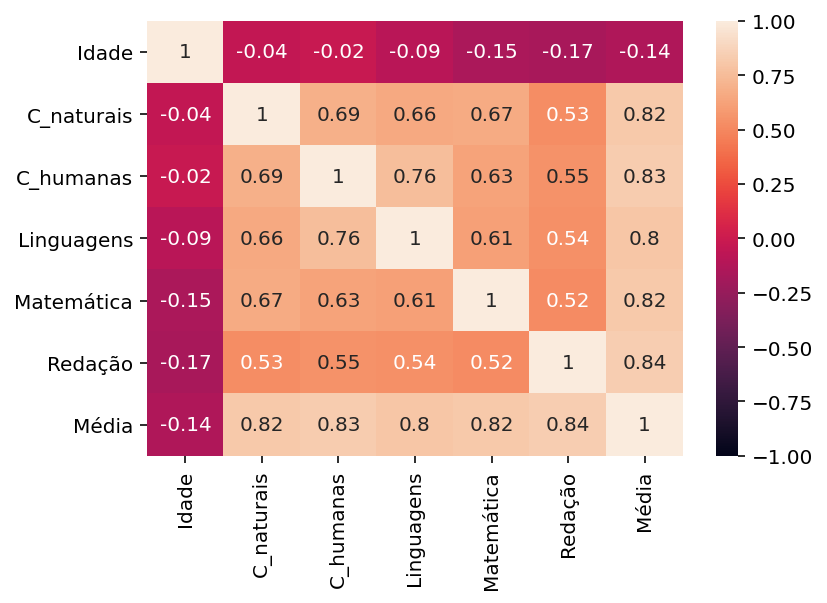

In [29]:
_ = sns.heatmap(enem_melhores.corr().round(2), annot=True, vmin=-1, vmax=1 )

Como idade não influencia nas notas dos alunos, deixaremos ela de fora do método PCA.

In [30]:
# selecionando as colunas com as notas
enem_num = enem_melhores.drop(
    [
        'Idade',
        'Gênero',
        'Raça',
        'Escola',
        'Escol_Pai',
        'Escol_Mãe',
        'Renda',
        'Internet',
        'Grande_SP',
        'Média',
    ],
    axis="columns",
)
enem_num.head(5)

,C_naturais,C_humanas,Linguagens,Matemática,Redação
40199,752.5,767.3,636.9,963.6,940.0
31651,728.4,724.7,639.6,943.6,980.0
8312,700.1,675.9,724.5,905.3,960.0
34639,730.7,710.6,651.5,867.2,940.0
21699,719.2,681.6,647.4,839.3,980.0


Apesar de neste caso sabermos que as variáveis já estão na mesma escala, mesmo assim será feito a padronização já que este é um pré-requisito para esta técnica e de clusterização também.

In [31]:
#padroniza os dados para ter uma média de ~ 0 e uma variância de 1
enem_num = StandardScaler().fit_transform(enem_num)

In [32]:
#cria a instância PCA
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(enem_num)

features = range(pca.n_components_)

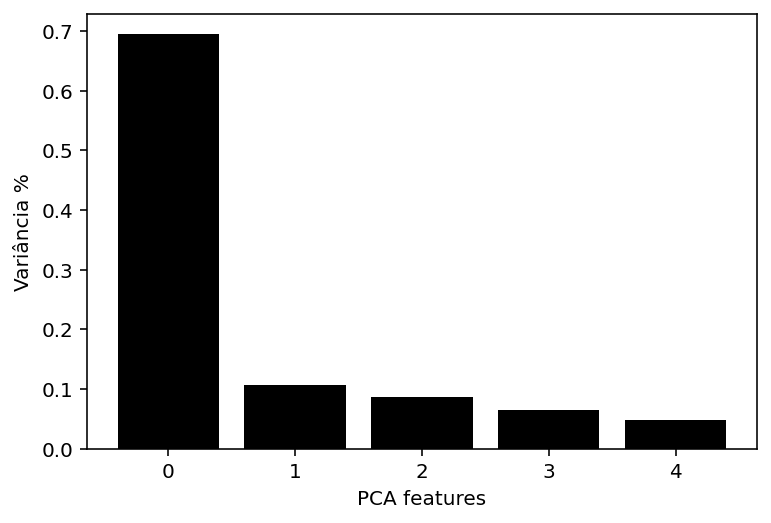

In [33]:
#plota  as variâncias explicativas
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('Variância %')
_ = plt.xticks(features)

O Gráfico acima mostra que os primeiros três componentes explicam quase que a totalidade da variância nos dados (principalmente o primeiro componente). A seguir será plotado apenas os dois primeiros com o objetivo de observar se existem clusters claros.

In [34]:
#salva os components em um DataFrame
PCA_components = pd.DataFrame(principalComponents)

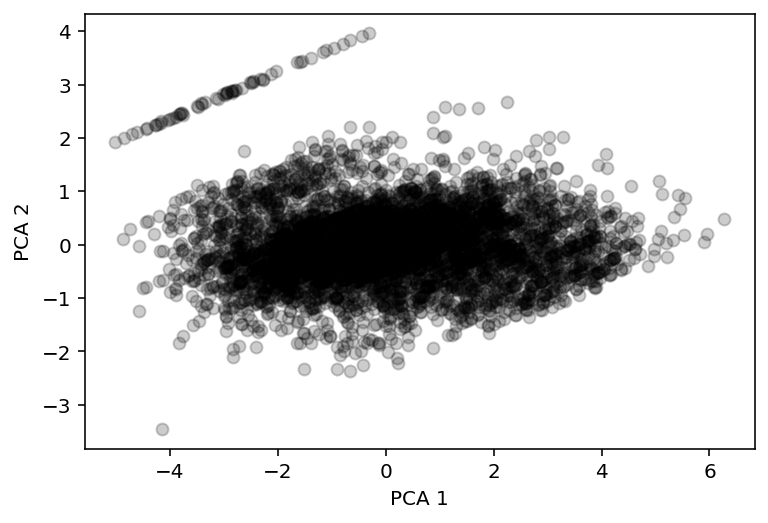

In [35]:
#pré-visualização de possíveis clusters
plt.scatter(PCA_components[0], PCA_components[1], alpha=.2, color='black')
plt.xlabel('PCA 1')
_ = plt.ylabel('PCA 2')

Acima não fica claro a presença de grupos, talvez 2. O primeiro mais acima e a esquerda com poucas amostras e o segundo abaixo centralizado com a maioria das amostras

#### Clusterização

![cluster](https://memegenerator.net/img/instances/59747081/were-all-in-this-together.jpg)

Vamos utilizar o método do cotovelo para investigar o número ideal de clusters. Para isso temos duas métricas difentes para calcularmos as variâncias intra-cluster.

- DIstorção: Média das distâncias quadradas dos centros dos respectivos clusters.
- inércia: Soma das distâncias quadradas das amostras até o centro do cluster mais próximo.

In [36]:
#cria modelo e calcula valores de distorção e inercia
distorcoes = []
inercias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)
 
for k in K:
    #cria o modelo
    model = KMeans(n_clusters=k)
    #treina o modelo
    model.fit(PCA_components.iloc[:, :3])
 
    distorcoes.append(sum(np.min(cdist(PCA_components.iloc[:, :3], model.cluster_centers_,
                                        'euclidean'), axis=1)) / PCA_components.iloc[:, :3].shape[0])
    inercias.append(model.inertia_)
 
    mapping1[k] = sum(np.min(cdist(PCA_components.iloc[:,:3], model.cluster_centers_,
                                   'euclidean'), axis=1)) / PCA_components.iloc[:, :3].shape[0]
    mapping2[k] = model.inertia_

In [37]:
#printa as distorções de cada cluster
for key, val in mapping1.items():
    print(f'Cluster {key}: {val:.3f}')

Cluster 1: 1.857
Cluster 2: 1.319
Cluster 3: 1.117
Cluster 4: 1.019
Cluster 5: 0.970
Cluster 6: 0.916
Cluster 7: 0.871
Cluster 8: 0.836
Cluster 9: 0.808


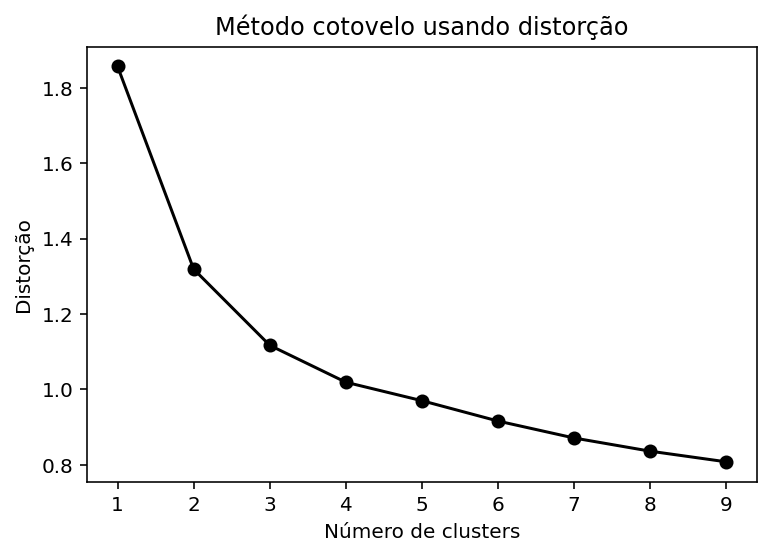

In [38]:
plt.plot(K, distorcoes, '-o', color='black')
plt.xlabel('Número de clusters')
plt.ylabel('Distorção')
plt.title('Método cotovelo usando distorção')
_ = plt.show()

In [39]:
#printa as inercias de cada cluster
for key, val in mapping2.items():
    print(f'Cluster {key}: {val:.3f}')

Cluster 1: 22215.972
Cluster 2: 10642.120
Cluster 3: 7598.847
Cluster 4: 6395.324
Cluster 5: 5682.238
Cluster 6: 5097.742
Cluster 7: 4616.452
Cluster 8: 4247.107
Cluster 9: 3973.306


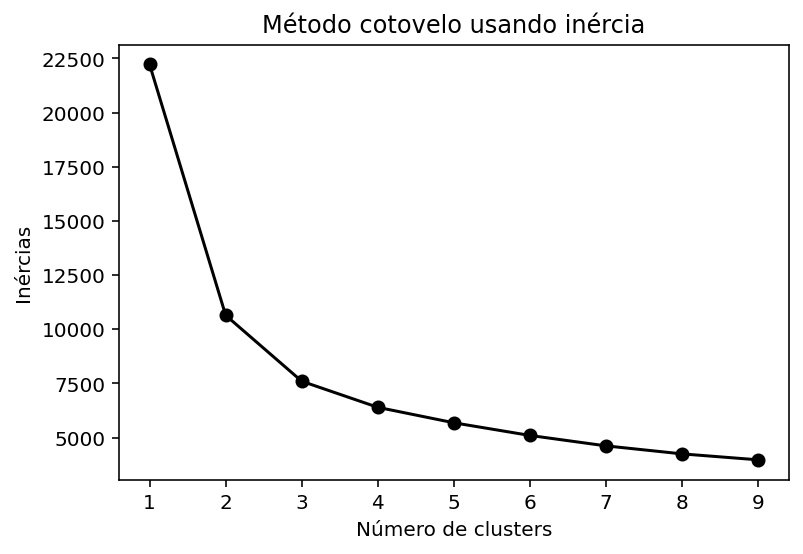

In [40]:
plt.plot(K, inercias, '-o', color='black')
plt.xlabel('Número de clusters')
plt.ylabel('Inércias')
plt.title('Método cotovelo usando inércia')
_ = plt.show()

Podemos observar que ambas as curvas são bem parecidas, e que a variância interna não tem grandes quedas a partir de 3 clusters, que será nosso número ideal de grupos (o cotovelo).

Agora vamos finalmente clusterizar nossos dados.

In [41]:
#cria o modelo
kmeans_model = KMeans(n_clusters=3, random_state=13)
#treina o modelo
kmeans_model.fit(PCA_components.iloc[:,:3])

KMeans(n_clusters=3, random_state=13)

In [42]:
#aplica os clusters de volta nos dados
enem_melhores['Clusters'] = kmeans_model.labels_
#transforma a coluna em categória
enem_melhores['Clusters'] = enem_melhores['Clusters'].astype('object')

enem_melhores

,Idade,Gênero,Raça,Escola,C_naturais,C_humanas,Linguagens,Matemática,Redação,Escol_Pai,Escol_Mãe,Renda,Internet,Grande_SP,Média,Clusters
40199,18,Masculino,Branca,ND,752.5,767.3,636.9,963.6,940.0,Graduada,Graduada,Mais de 11.976,Sim,Não,812.06,0
31651,18,Masculino,Branca,Privada,728.4,724.7,639.6,943.6,980.0,Graduada,Graduada,Mais de 11.976,Sim,Não,803.26,0
8312,19,Masculino,Branca,ND,700.1,675.9,724.5,905.3,960.0,Graduada,Graduada,2.495 a 8.982,Sim,Não,793.16,0
34639,21,Feminino,Branca,ND,730.7,710.6,651.5,867.2,940.0,Pós-graduada,Graduada,Mais de 11.976,Sim,Sim,780.00,0
21699,19,Masculino,Branca,ND,719.2,681.6,647.4,839.3,980.0,Não completou ES,Não completou ES,2.495 a 8.982,Sim,Sim,773.50,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36389,35,Masculino,Branca,ND,407.3,383.5,441.3,407.8,0.0,Não completou ES,Não completou ES,0 a 1.497,Sim,Sim,327.98,1
11980,18,Feminino,Parda,Pública,385.2,387.3,446.5,383.8,0.0,Não completou ES,Não completou EM,0 a 1.497,Não,Sim,320.56,1
7698,20,Feminino,Branca,ND,357.6,446.6,418.5,367.5,0.0,Não completou ES,Não completou ES,2.495 a 8.982,Sim,Não,318.04,1
18795,22,Masculino,Parda,Pública,373.4,399.6,426.6,364.1,0.0,Nunca estudou,Não completou metade EF,0 a 1.497,Não,Sim,312.74,1


In [43]:
#adiciona o label no dataset da PCA
PCA_components['Clusters'] = kmeans_model.labels_
#transforma a coluna em categória
PCA_components['Clusters'] = PCA_components['Clusters'].astype('category')
#renomeia as colunas
PCA_components.rename(
    columns={
        0: 'PCA1',
        1: 'PCA2',
        2: 'PCA3',
        3: 'PCA4',
        4: 'PCA5',
    },
    inplace=True,
)

In [44]:
#plota a clusterização
fig = px.scatter_3d(PCA_components, x='PCA1', y='PCA2', z='PCA3', 
                    color='Clusters', opacity=.8
                   )
_ = fig.show()

## Análise descritiva

![x.gif](https://media.giphy.com/media/l4FB9RkwXRTCTnpuw/giphy.gif)

### Divisão dos Grupos

Investigando a divisão dos grupos com base no desempenho.

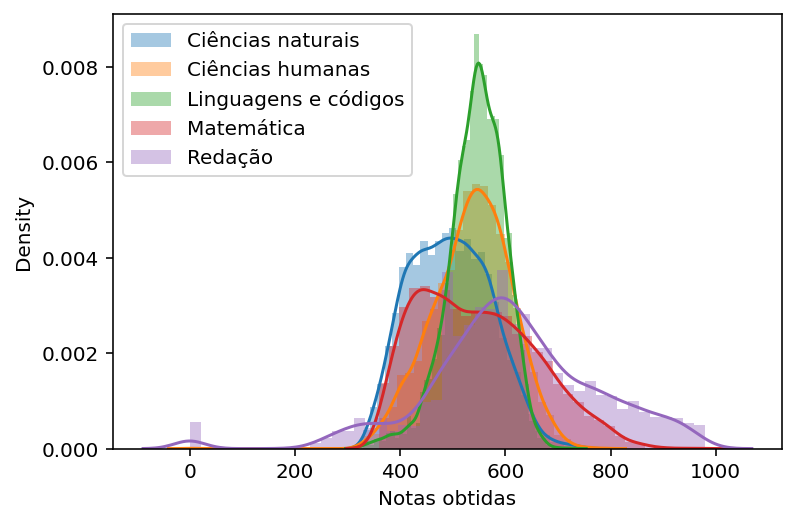

In [45]:
#histograma das notas
sns.distplot(enem_melhores['C_naturais'], kde = True, label='Ciências naturais')
sns.distplot(enem_melhores['C_humanas'], kde = True, label='Ciências humanas')
sns.distplot(enem_melhores['Linguagens'], kde = True, label='Linguagens e códigos')
sns.distplot(enem_melhores['Matemática'], kde = True, label='Matemática')
sns.distplot(enem_melhores['Redação'], kde = True, label='Redação')
plt.xlabel('Notas obtidas')
plt.legend()
plt.show()

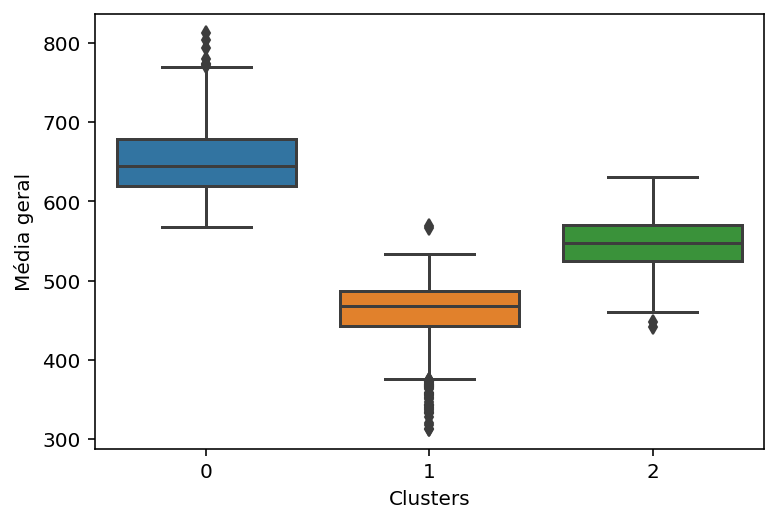

In [46]:
#boxplot
sns.boxplot(x="Clusters", y="Média", data=enem_melhores)
plt.ylabel('Média geral')
plt.show()

In [47]:
#medidas resumo - variáveis contínuas
enem_melhores.groupby(['Clusters']).describe().T

Clusters                    0            1            2
Idade      count  1251.000000  1565.000000  2184.000000
           mean     19.670663    21.415335    20.824634
           std       4.514892     6.926359     6.233355
           min      15.000000    15.000000    15.000000
           25%      17.000000    17.000000    17.000000
           50%      18.000000    18.000000    18.000000
           75%      20.000000    23.000000    22.000000
           max      61.000000    65.000000    79.000000
C_naturais count  1251.000000  1565.000000  2184.000000
           mean    586.471703   426.006965   493.070421
           std      46.002605    45.569600    49.346678
           min     407.800000   329.600000   342.400000
           25%     557.100000   393.900000   459.400000
           50%     582.700000   421.100000   495.950000
           75%     615.400000   455.400000   529.300000
           max     752.500000   618.700000   631.000000
C_humanas  count  1251.000000  1565.000000  2184.000000
           mean    619.645404   458.796166   544.311813
           std      40.121764    51.232714    38.786242
           min     373.400000     0.000000   381.900000
           25%     593.450000   423.400000   520.800000
           50%     617.100000   462.100000   546.600000
           75%     644.550000   496.900000   571.300000
           max     787.900000   596.900000   720.400000
Linguagens count  1251.000000  1565.000000  2184.000000
           mean    601.488809   490.033994   552.819002
           std      28.158676    42.906139    27.012126
           min     468.100000   325.700000   409.100000
           25%     583.700000   470.000000   536.700000
           50%     601.400000   498.400000   552.700000
           75%     619.200000   519.000000   571.125000
           max     724.500000   586.000000   640.000000
Matemática count  1251.000000  1565.000000  2184.000000
           mean    680.865228   456.739361   533.227656
           std      75.861984    60.351819    77.159191
           min     435.100000   359.000000   359.400000
           25%     632.050000   409.500000   474.175000
           50%     678.800000   446.500000   536.150000
           75%     731.300000   493.200000   591.900000
           max     963.600000   696.600000   765.300000
Redação    count  1251.000000  1565.000000  2184.000000
           mean    770.535572   478.402556   614.725275
           std     114.743335   141.615646   105.615217
           min     340.000000     0.000000     0.000000
           25%     680.000000   420.000000   560.000000
           50%     780.000000   500.000000   600.000000
           75%     860.000000   560.000000   680.000000
           max     980.000000   900.000000   960.000000
Média      count  1251.000000  1565.000000  2184.000000
           mean    651.801343   461.995808   547.630833
           std      40.592879    36.035724    29.748410
           min     568.160000   312.720000   440.860000
           25%     619.220000   441.980000   524.730000
           50%     644.940000   468.480000   547.050000
           75%     679.320000   487.000000   570.390000
           max     812.060000   568.980000   630.360000

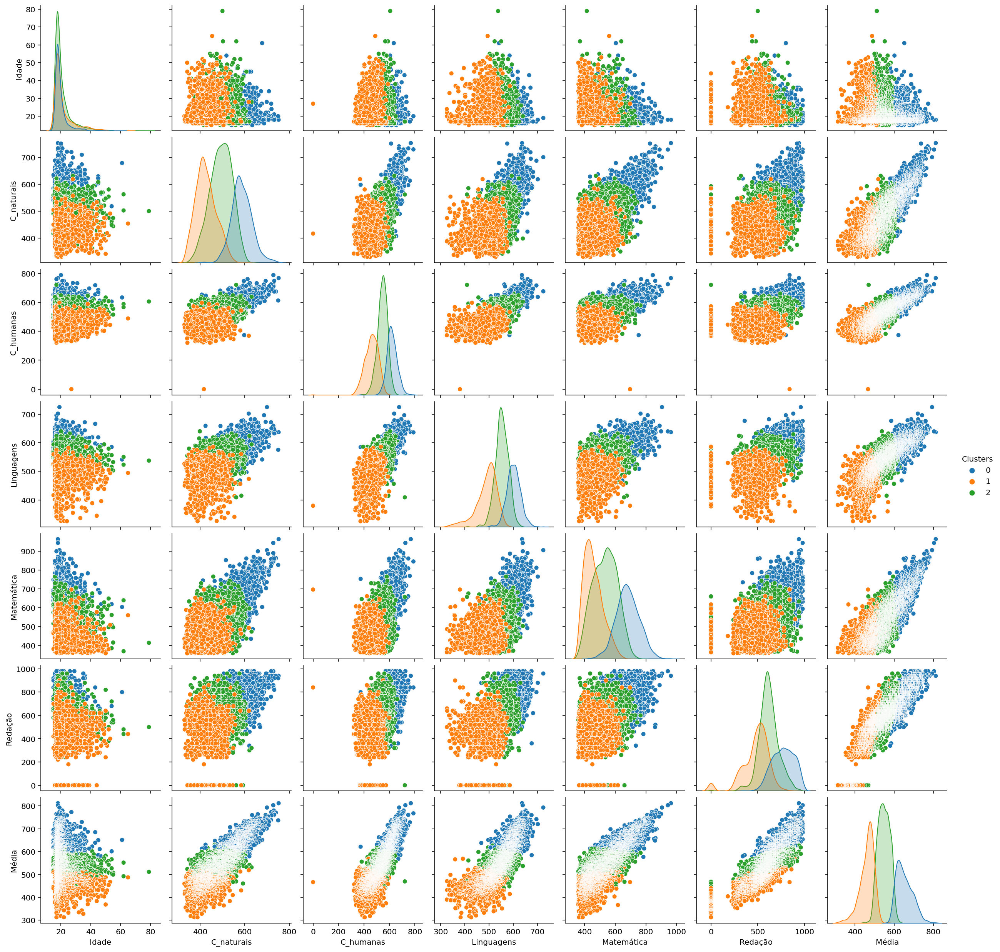

In [48]:
sns_plot = sns.pairplot(enem_melhores, hue='Clusters', palette="tab10")

Através da análise dos gráficos acima podemos afirmar:
- Muitos alunos do **Cluster 1** zeraram a redação, existe uma variável que não foi incluida nesse estudo - TP_STATUS_REDACAO - que poderia esclarecer o motivo. Este pode ter sido um fator determinate para estes indivíduos estarem classificados no grupo com pior desempenho;
- Como a média é composta por todas as outras notas, podemos ver uma relação de linearidade entre elas;
- O **Cluster 0** é composto dos melhores vestibulandos, seguido pelo **Cluster 2** e por último o **Cluster 1**;

### Cluster 0

A elite dos vestibulandos paulistas é composta por:

In [49]:
#resumo das notas
cluster0 = enem_melhores[enem_melhores['Clusters']  == 0]
cluster0.describe().round(2)

,Idade,C_naturais,C_humanas,Linguagens,Matemática,Redação,Média
count,1251.00,1251.00,1251.00,1251.00,1251.00,1251.00,1251.00
mean,19.67,586.47,619.65,601.49,680.87,770.54,651.80
std,4.51,46.00,40.12,28.16,75.86,114.74,40.59
min,15.00,407.80,373.40,468.10,435.10,340.00,568.16
25%,17.00,557.10,593.45,583.70,632.05,680.00,619.22
50%,18.00,582.70,617.10,601.40,678.80,780.00,644.94
75%,20.00,615.40,644.55,619.20,731.30,860.00,679.32
max,61.00,752.50,787.90,724.50,963.60,980.00,812.06


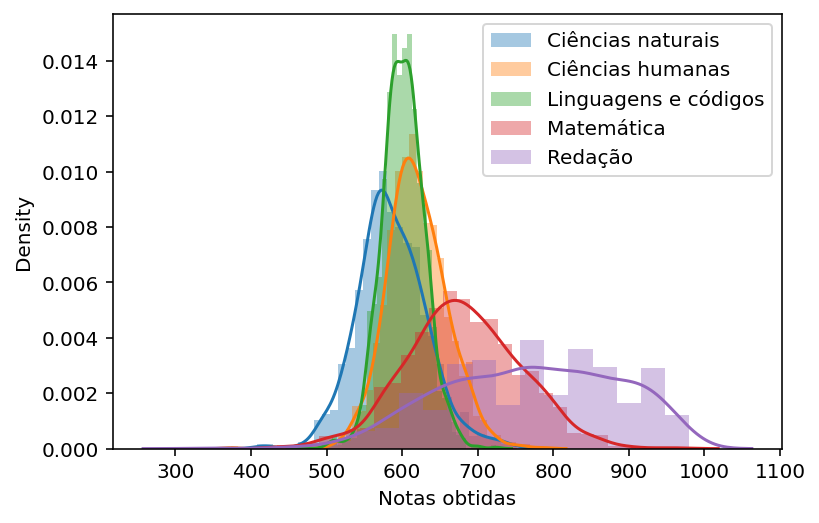

In [50]:
#histograma das notas
sns.distplot(cluster0['C_naturais'], kde = True, label='Ciências naturais')
sns.distplot(cluster0['C_humanas'], kde = True, label='Ciências humanas')
sns.distplot(cluster0['Linguagens'], kde = True, label='Linguagens e códigos')
sns.distplot(cluster0['Matemática'], kde = True, label='Matemática')
sns.distplot(cluster0['Redação'], kde = True, label='Redação')
plt.xlabel('Notas obtidas')
plt.legend()
plt.show()

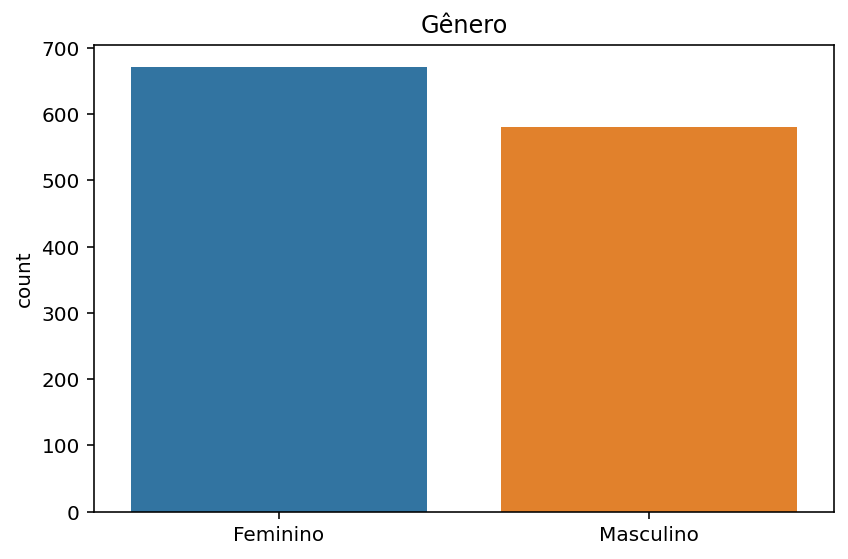

In [51]:
#frequência gênero
sns.countplot(x='Gênero', data=cluster0)
plt.xlabel('')
plt.title('Gênero')
plt.tight_layout()
plt.show()

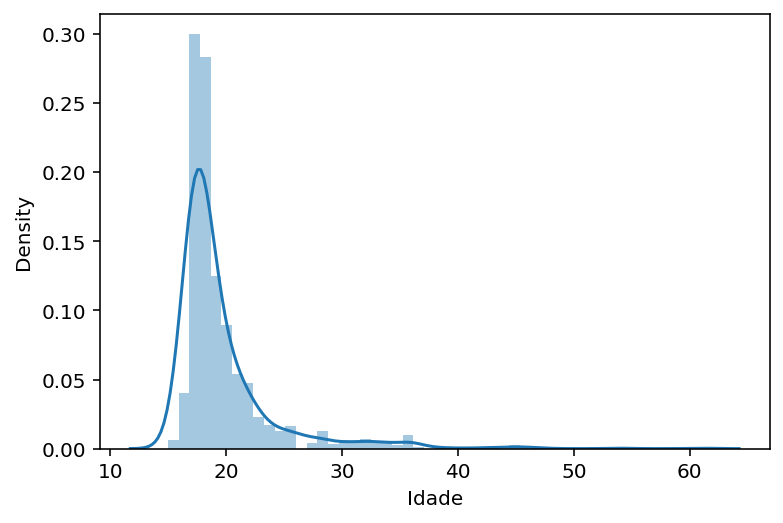

In [52]:
#histograma
sns.distplot(cluster0['Idade'], kde = True)
plt.xlabel('Idade')
plt.show()

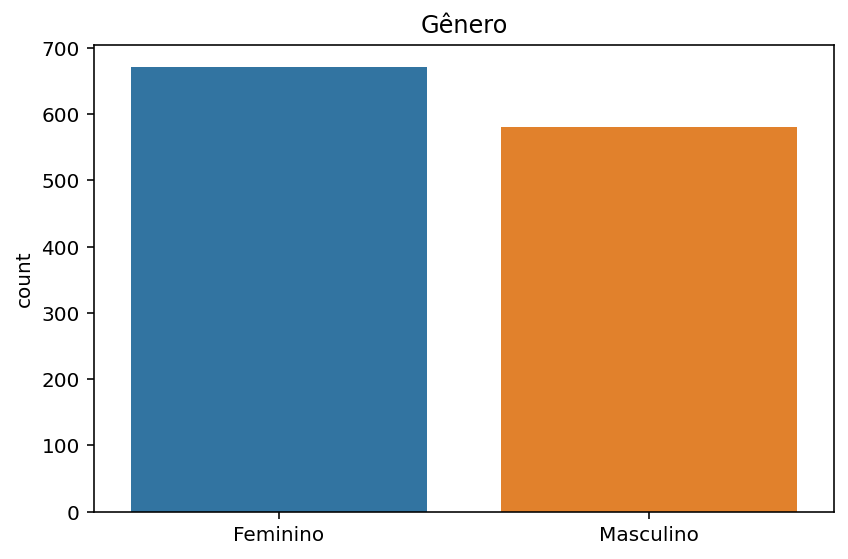

In [53]:
#frequência gênero
sns.countplot(x='Gênero', data=cluster0)
plt.xlabel('')
plt.title('Gênero')
plt.tight_layout()
plt.show()

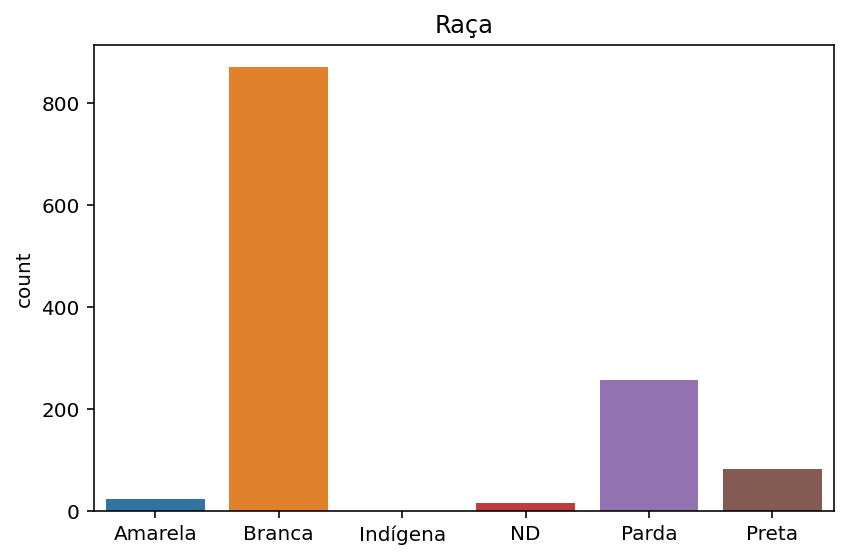

In [54]:
#frequência raça
sns.countplot(x='Raça', data=cluster0)
plt.xlabel('')
plt.title('Raça')
plt.tight_layout()
plt.show()

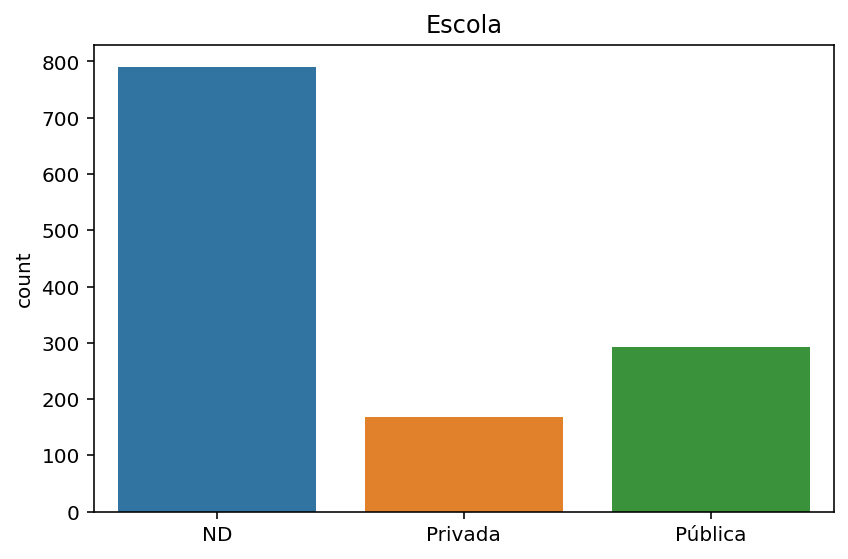

In [55]:
#frequência tipo de escola
sns.countplot(x='Escola', data=cluster0)
plt.xlabel('')
plt.title('Escola')
plt.tight_layout()
plt.show()

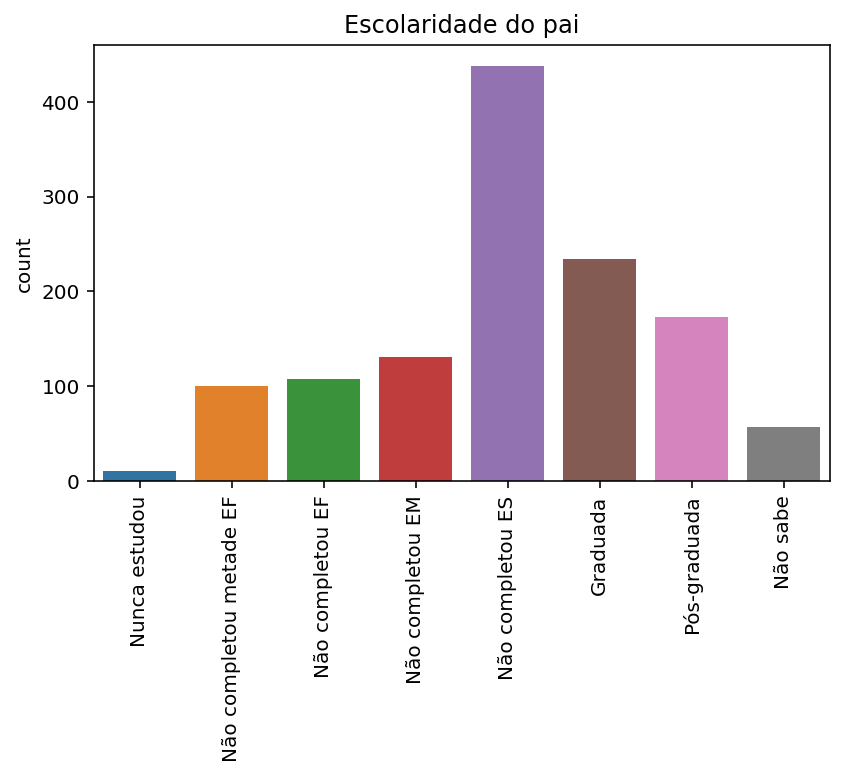

In [56]:
#frequência escolaridade do pai
sns.countplot(x='Escol_Pai', data=cluster0)
plt.title('Escolaridade do pai')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

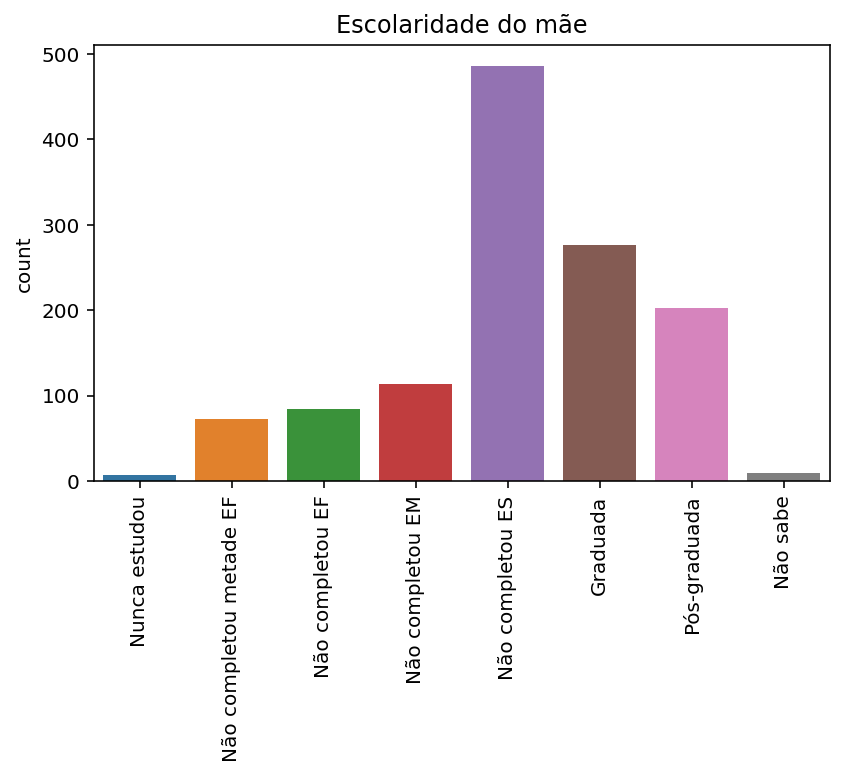

In [57]:
#frequência escolaridade da mãe
sns.countplot(x='Escol_Mãe', data=cluster0)
plt.title('Escolaridade do mãe')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

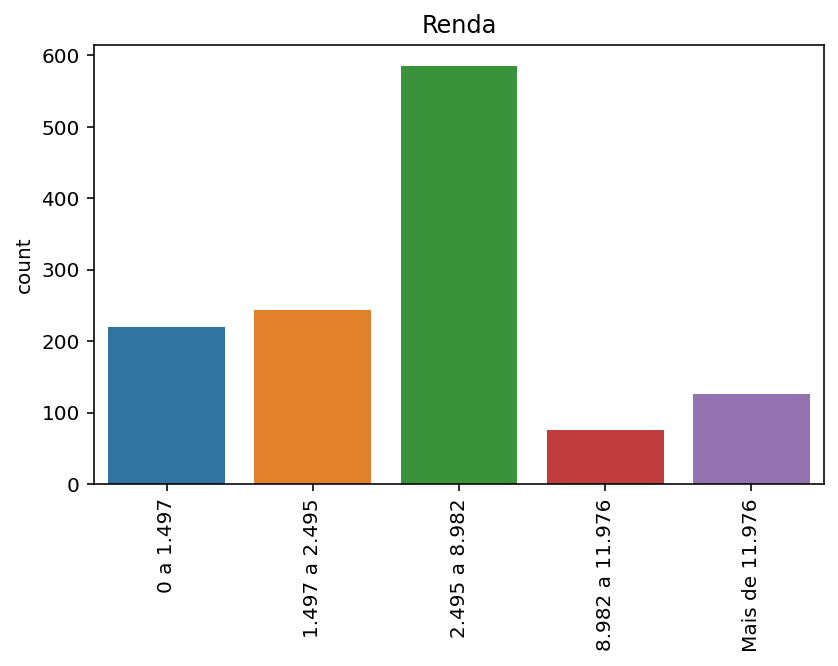

In [58]:
#frequência renda
sns.countplot(x='Renda', data=cluster0)
plt.title('Renda')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

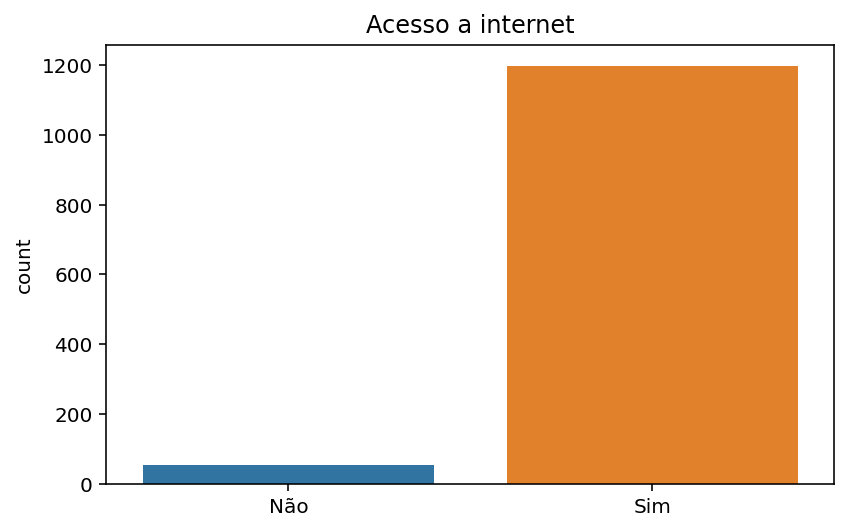

In [59]:
#frequência acesso internet
sns.countplot(x='Internet', data=cluster0)
plt.title('Acesso a internet')
plt.tight_layout()
plt.xlabel('')
plt.show()

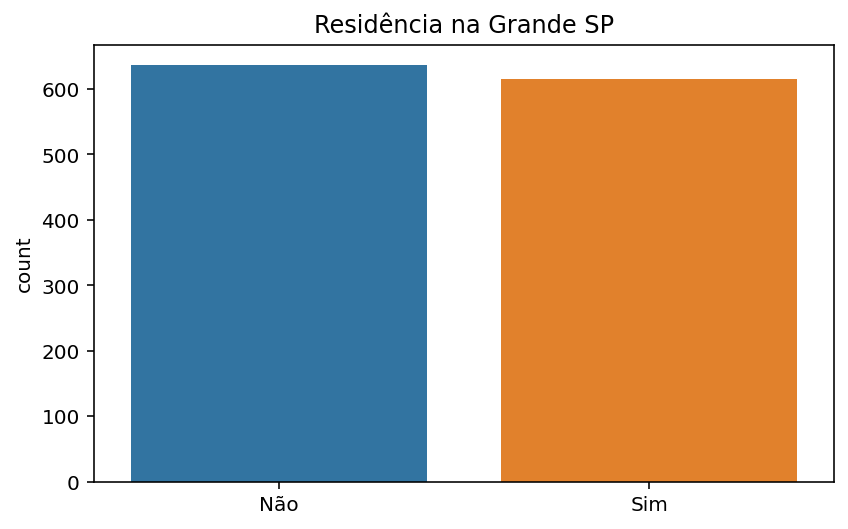

In [60]:
#frequência residência
sns.countplot(x='Grande_SP', data=cluster0)
plt.title('Residência na Grande SP')
plt.tight_layout()
plt.xlabel('')
plt.show()

#### Análise Multivariada

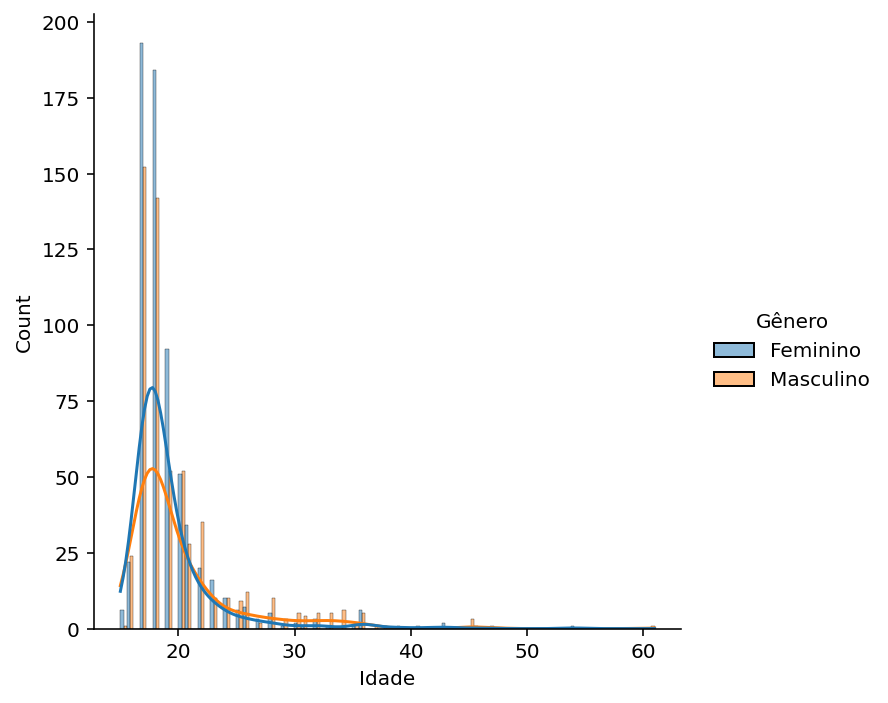

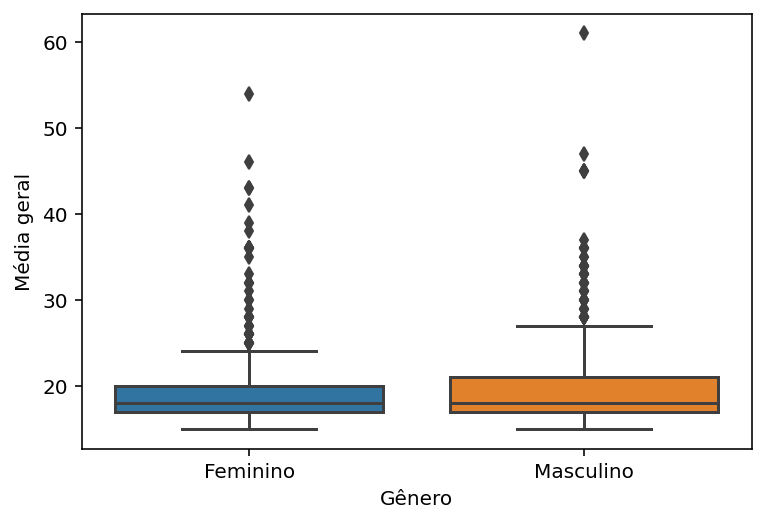

In [61]:
#distribuição da idade
sns.displot(cluster0, x='Idade', hue='Gênero', multiple='dodge', kde=True)
plt.show()

#boxplot
sns.boxplot(x='Gênero', y="Idade", data=cluster0)
plt.ylabel('Média geral')
plt.show()

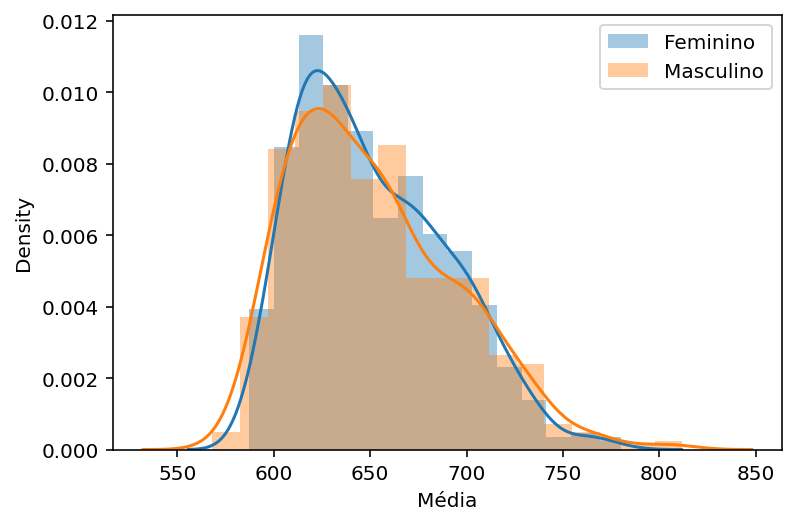

In [62]:
#histograma das notas
sns.distplot(cluster0[cluster0['Gênero'] == 'Feminino']['Média'], kde = True, label = 'Feminino')
sns.distplot(cluster0[cluster0['Gênero'] == 'Masculino']['Média'], kde = True, label = 'Masculino')
plt.xlabel('Média')
plt.legend()
plt.show()

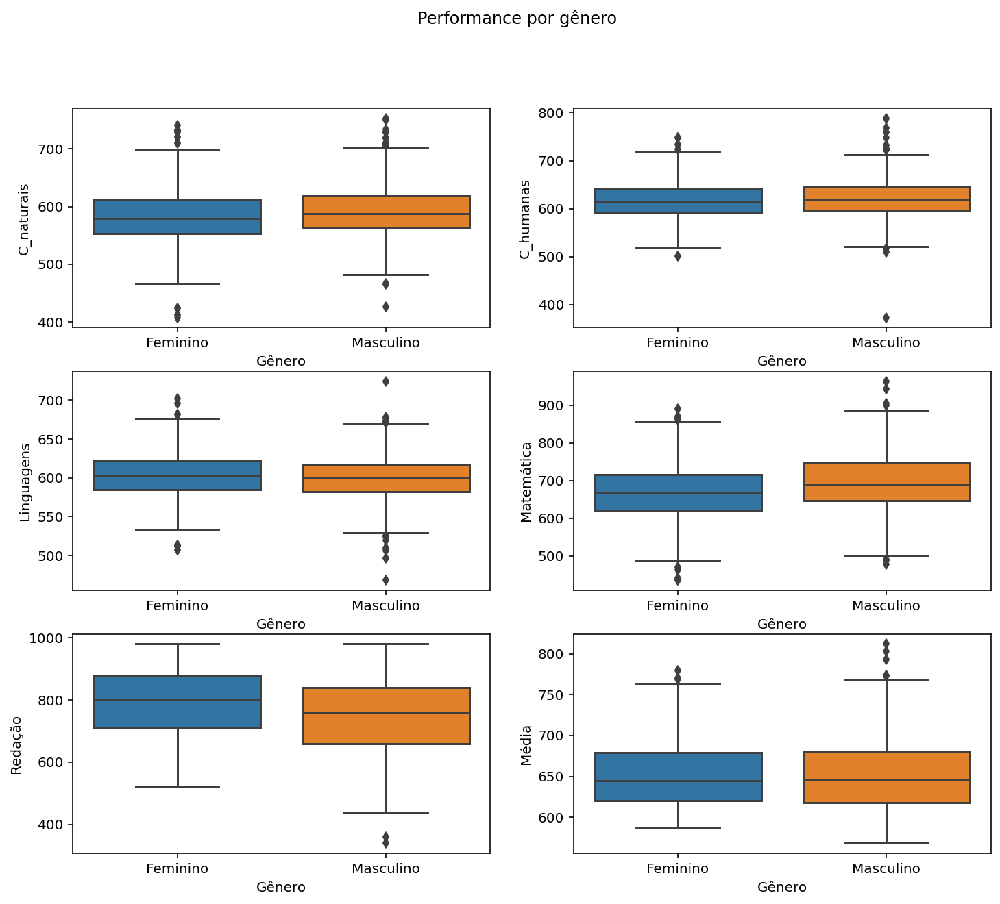

In [63]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle('Performance por gênero')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Gênero', y='C_naturais', data=cluster0)
#axes[0, 0].set_title('Nota ciências naturais')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Gênero', y='C_humanas', data=cluster0)
#axes[0, 1].set_title('Nota ciências humanas')
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Gênero', y='Linguagens', data=cluster0)
#axes[1, 0].set_title('Nota Linguagens')
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Gênero', y='Matemática', data=cluster0)
#axes[1, 1].set_title('Nota Matemática')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Gênero', y='Redação', data=cluster0)
#axes[2, 0].set_title('Nota Redação')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Gênero', y='Média', data=cluster0)
#axes[2, 1].set_title('Nota Média')
plt.show()

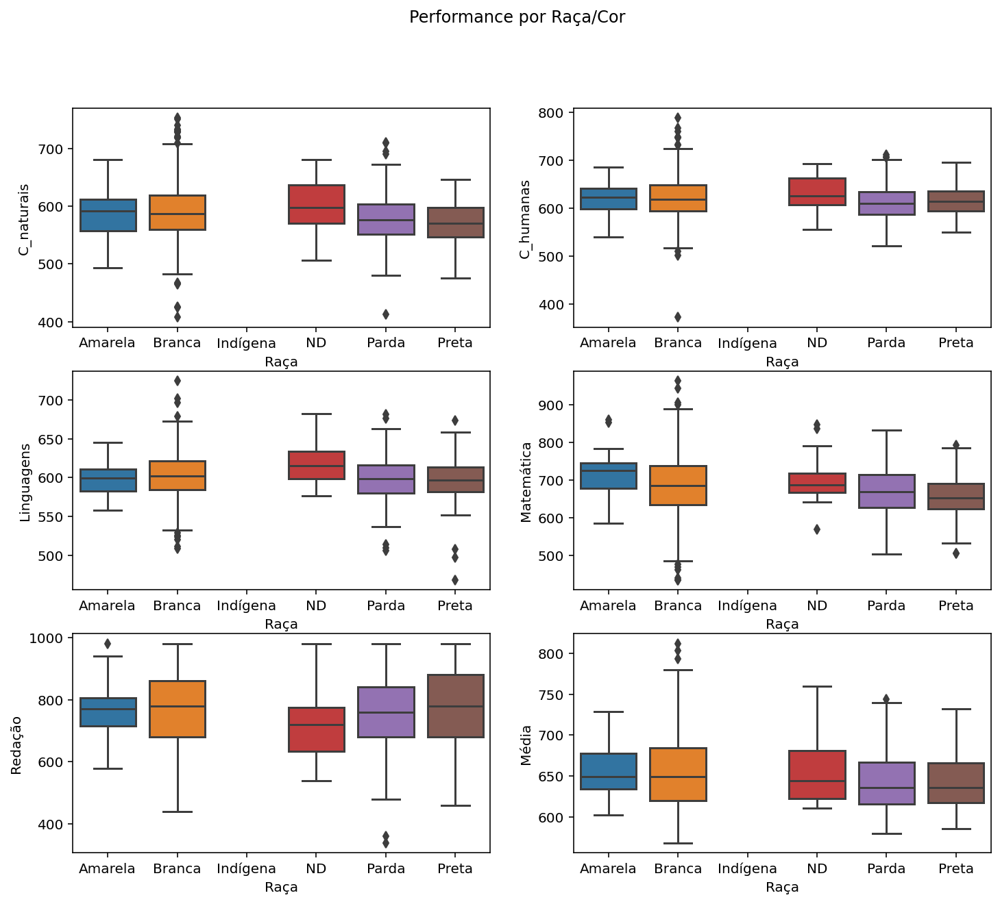

In [64]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle('Performance por Raça/Cor')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Raça', y='C_naturais', data=cluster0)
#axes[0, 0].set_title('Nota ciências naturais')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Raça', y='C_humanas', data=cluster0)
#axes[0, 1].set_title('Nota ciências humanas')
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Raça', y='Linguagens', data=cluster0)
#axes[1, 0].set_title('Nota Linguagens')
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Raça', y='Matemática', data=cluster0)
#axes[1, 1].set_title('Nota Matemática')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Raça', y='Redação', data=cluster0)
#axes[2, 0].set_title('Nota Redação')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Raça', y='Média', data=cluster0)
#axes[2, 1].set_title('Nota Média')
plt.show()

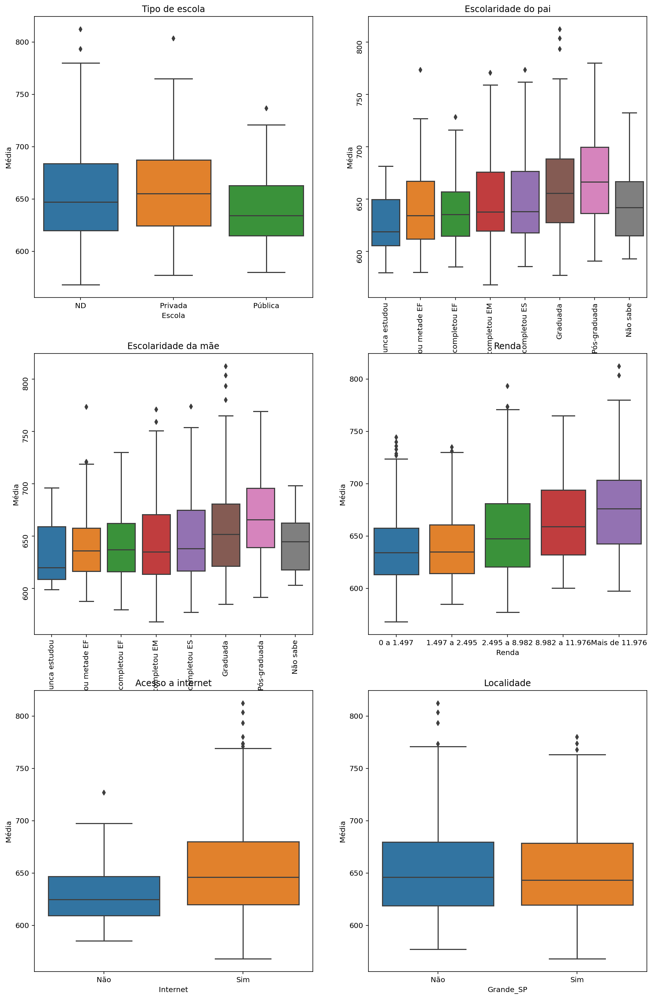

In [65]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(15, 24))
#fig.suptitle('Performance geral por categoria')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Escola', y='Média', data=cluster0)
axes[0, 0].set_title('Tipo de escola')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Escol_Pai', y='Média', data=cluster0)
axes[0, 1].set_title('Escolaridade do pai')
axes[0, 1].tick_params(labelrotation=90)
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Escol_Mãe', y='Média', data=cluster0)
axes[1, 0].set_title('Escolaridade da mãe')
axes[1, 0].tick_params(labelrotation=90)
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Renda', y='Média', data=cluster0)
axes[1, 1].set_title('Renda')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Internet', y='Média', data=cluster0)
axes[2, 0].set_title('Acesso a internet')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Grande_SP', y='Média', data=cluster0)
axes[2, 1].set_title('Localidade')

plt.show()

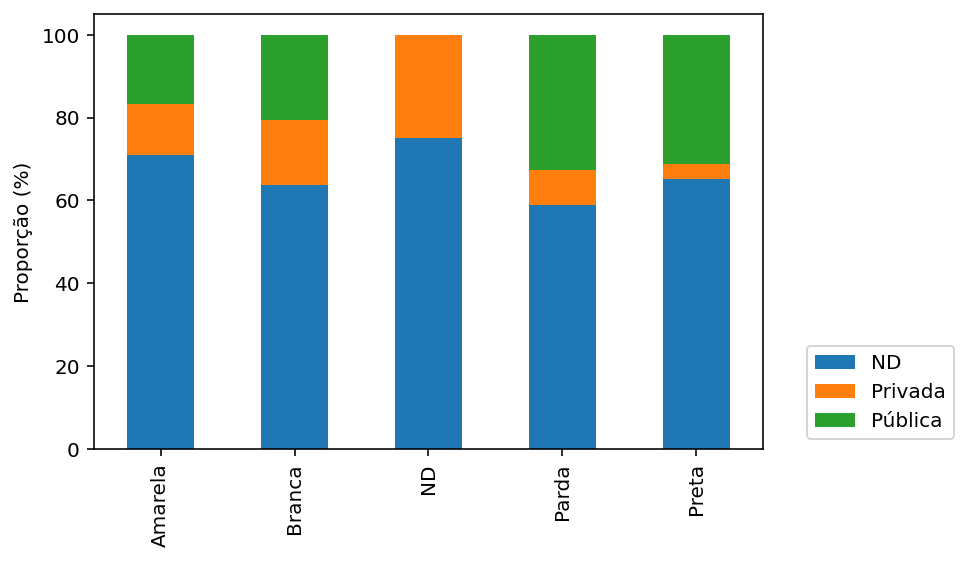

In [66]:
#porporção escola x raça neste cluster
ct = pd.crosstab(cluster0['Raça'],
                 cluster0['Escola'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

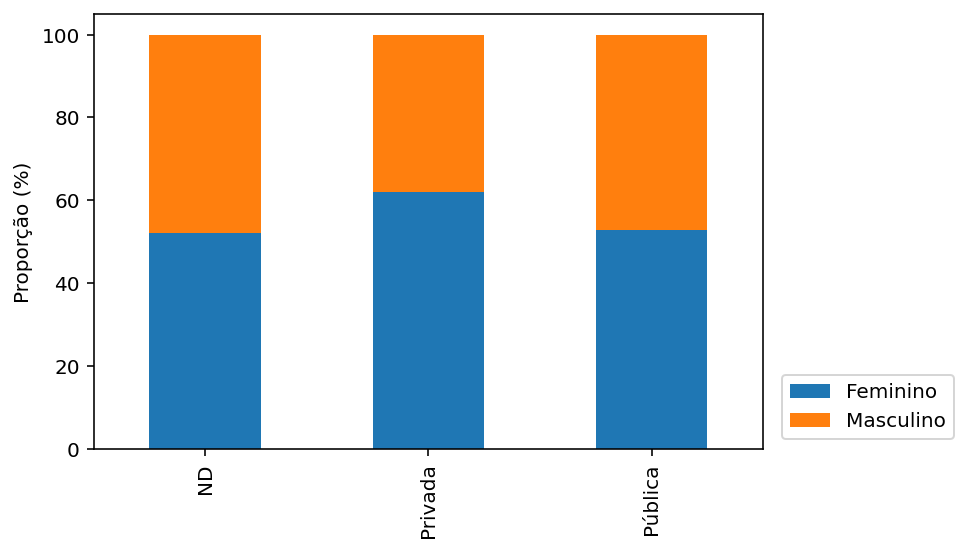

In [67]:
#porporção gênero x escola neste cluster
ct = pd.crosstab(cluster0['Escola'],
                 cluster0['Gênero'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

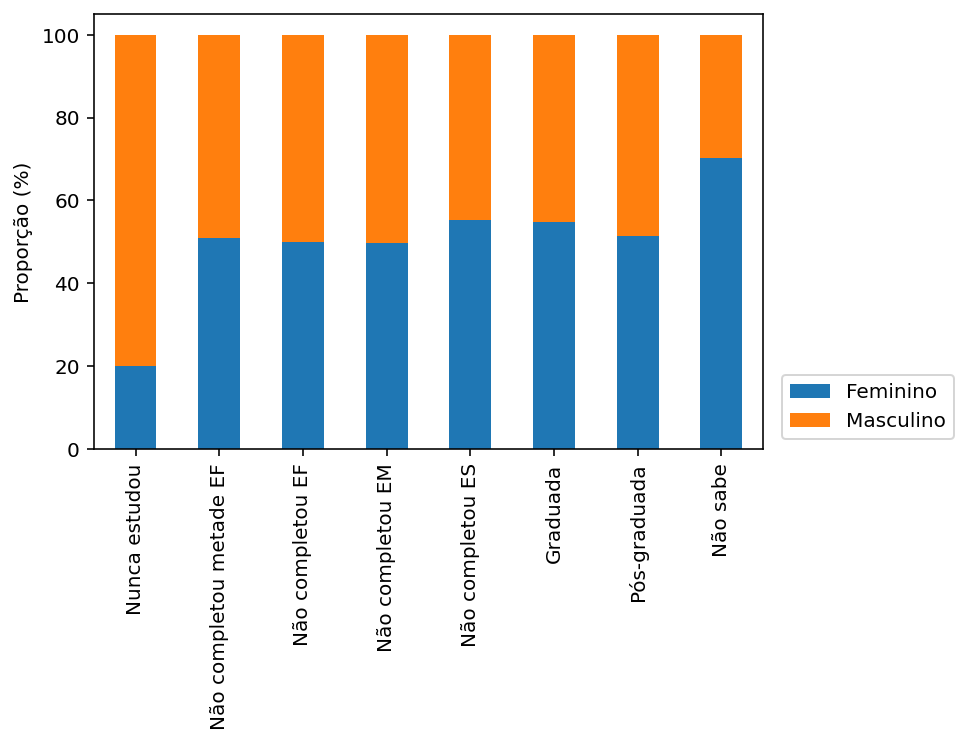

In [68]:
#porporção gênero x escolaridade do pai neste cluster
ct = pd.crosstab(cluster0['Escol_Pai'],
                 cluster0['Gênero'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

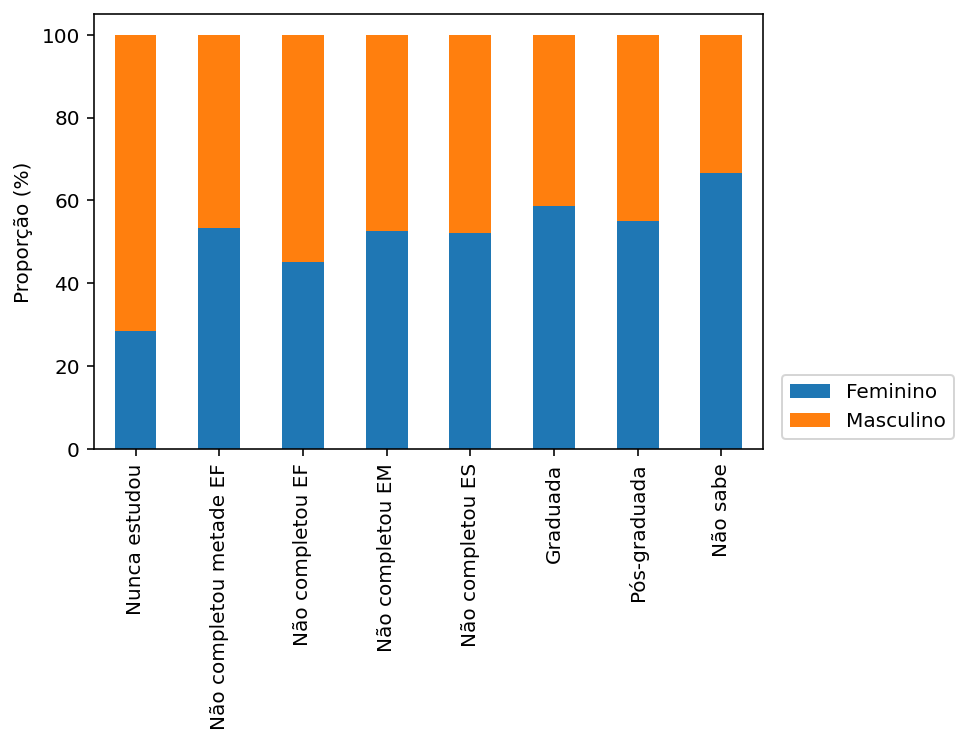

In [69]:
#porporção gênero x escolaridade da mãe neste cluster
ct = pd.crosstab(cluster0['Escol_Mãe'],
                 cluster0['Gênero'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

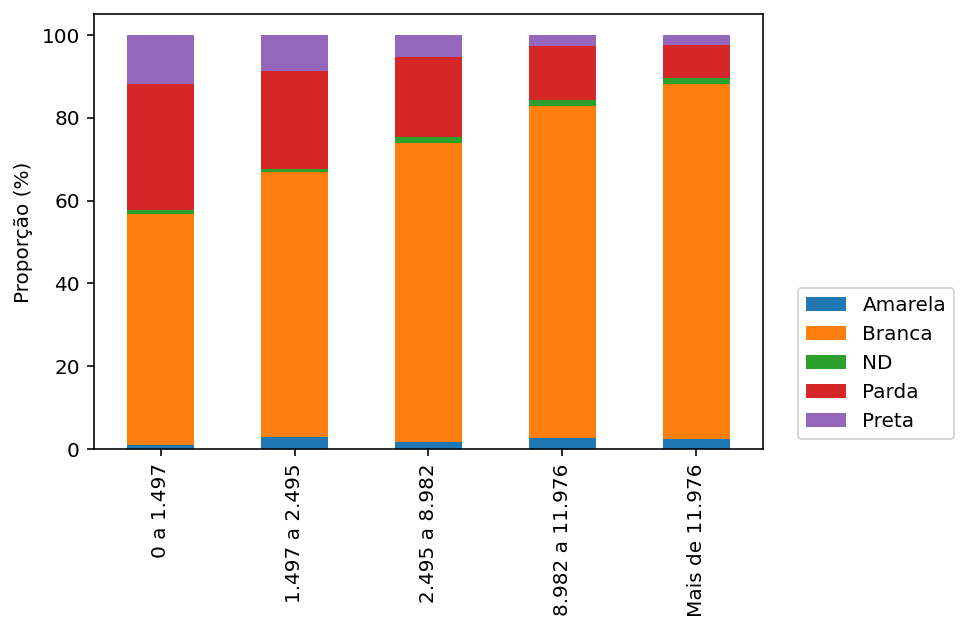

In [70]:
#porporção raça x renda neste cluster
ct = pd.crosstab(cluster0['Renda'],
                 cluster0['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

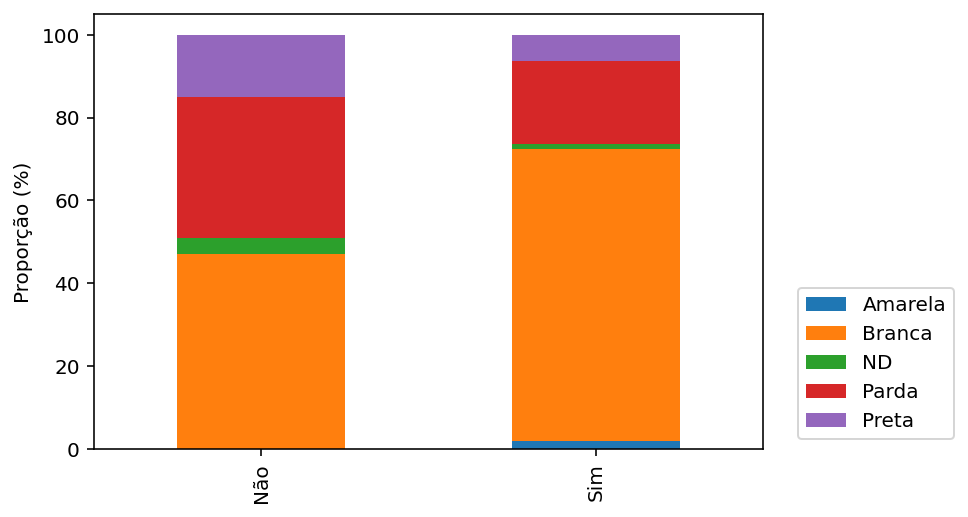

In [71]:
#porporção raça x internet neste cluster
ct = pd.crosstab(cluster0['Internet'],
                 cluster0['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

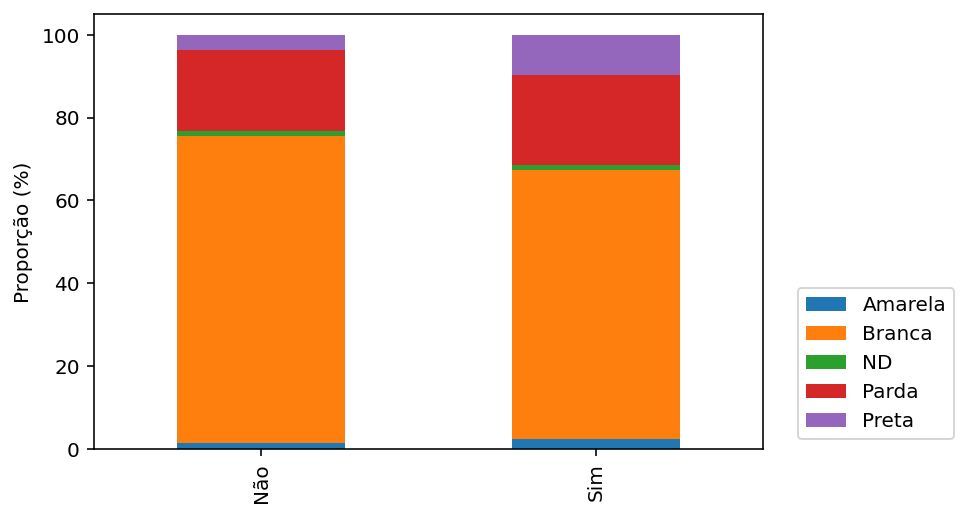

In [72]:
#porporção raça x localidade neste cluster
ct = pd.crosstab(cluster0['Grande_SP'],
                 cluster0['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

#### Conclusões Cluster 0

- Média de idade dos candidatos é de ~19 anos.
- Predominância de pessoas que se autodeclaram brancas, ausência de indígenas e baixa representatividade de negros;
- Maioria não declarou em qual escola estudou, valeria uma investigação se essas pessoas vieram de cursinhos já que essa categoria não se encaixa nessa variável, porém temos uma presença maior de alunos vindos da escola pública;
- Para maioria dos candidatos os pais não completaram o ensino superior;
- Seguindo ranking da FGV, maioria é da *classe C*;
- Maioria esmagadora possui acesso a internet;
- Presença equilibrada de candidatos do interior e da grande sp.

### Cluster 2

O segundo pelotão da elite dos vestibulandos paulistas é composta por:

In [73]:
#resumo das notas
cluster2 = enem_melhores[enem_melhores['Clusters']  == 2]
cluster2.describe().round(2)

,Idade,C_naturais,C_humanas,Linguagens,Matemática,Redação,Média
count,2184.00,2184.00,2184.00,2184.00,2184.00,2184.00,2184.00
mean,20.82,493.07,544.31,552.82,533.23,614.73,547.63
std,6.23,49.35,38.79,27.01,77.16,105.62,29.75
min,15.00,342.40,381.90,409.10,359.40,0.00,440.86
25%,17.00,459.40,520.80,536.70,474.17,560.00,524.73
50%,18.00,495.95,546.60,552.70,536.15,600.00,547.05
75%,22.00,529.30,571.30,571.12,591.90,680.00,570.39
max,79.00,631.00,720.40,640.00,765.30,960.00,630.36


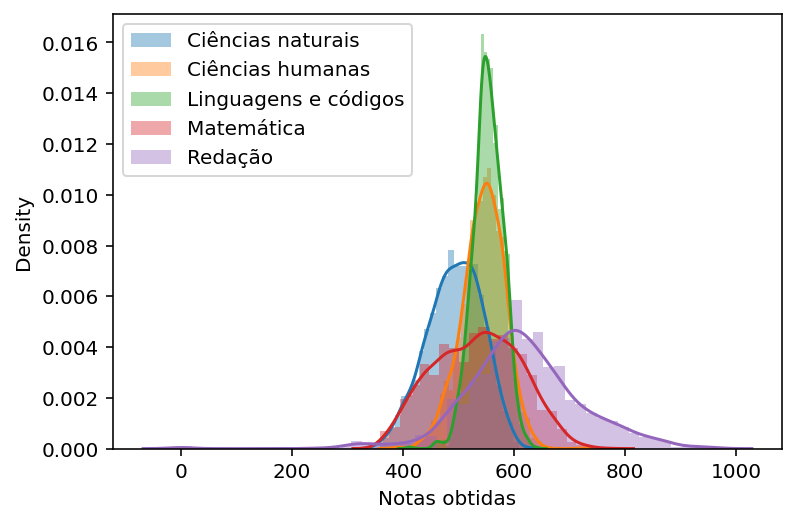

In [74]:
#histograma das notas
sns.distplot(cluster2['C_naturais'], kde = True, label='Ciências naturais')
sns.distplot(cluster2['C_humanas'], kde = True, label='Ciências humanas')
sns.distplot(cluster2['Linguagens'], kde = True, label='Linguagens e códigos')
sns.distplot(cluster2['Matemática'], kde = True, label='Matemática')
sns.distplot(cluster2['Redação'], kde = True, label='Redação')
plt.xlabel('Notas obtidas')
plt.legend()
plt.show()

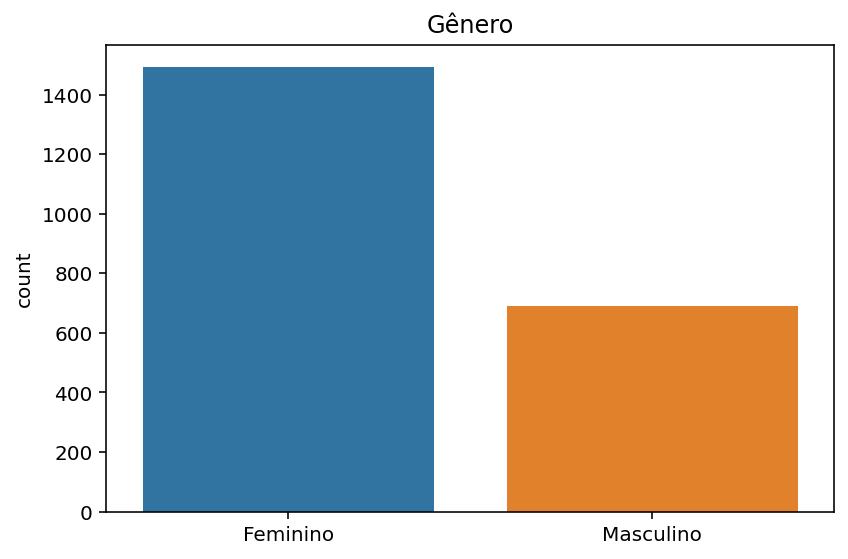

In [75]:
#frequência gênero
sns.countplot(x='Gênero', data=cluster2)
plt.xlabel('')
plt.title('Gênero')
plt.tight_layout()
plt.show()

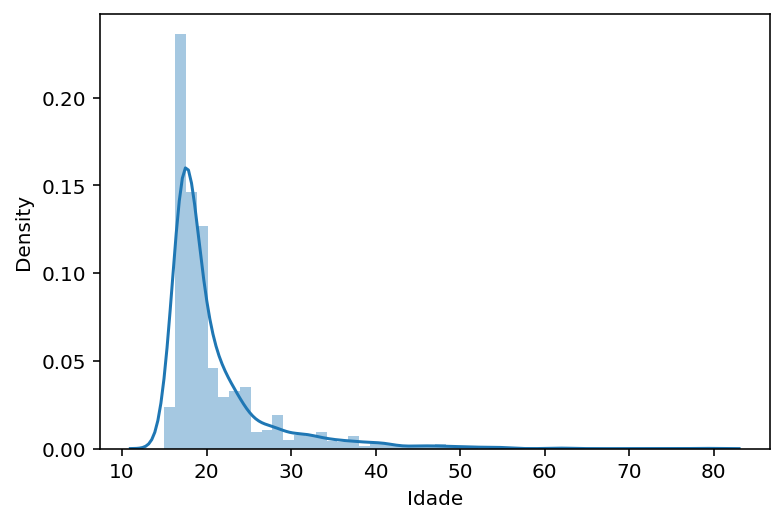

In [76]:
#histograma
sns.distplot(cluster2['Idade'], kde = True)
plt.xlabel('Idade')
plt.show()

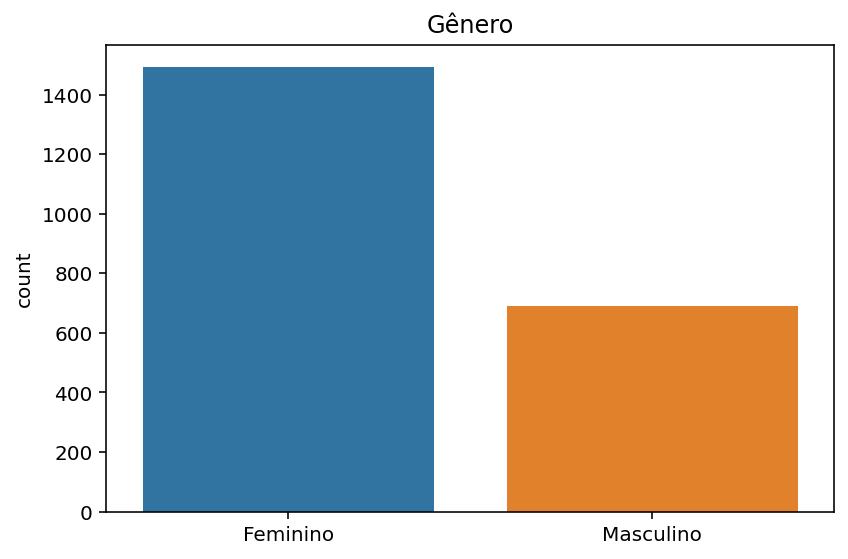

In [77]:
#frequência gênero
sns.countplot(x='Gênero', data=cluster2)
plt.xlabel('')
plt.title('Gênero')
plt.tight_layout()
plt.show()

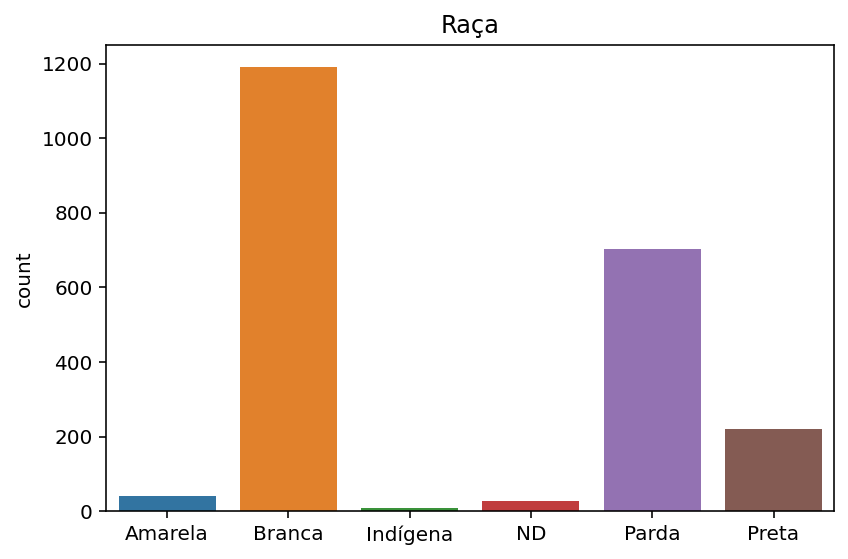

In [78]:
#frequência raça
sns.countplot(x='Raça', data=cluster2)
plt.xlabel('')
plt.title('Raça')
plt.tight_layout()
plt.show()

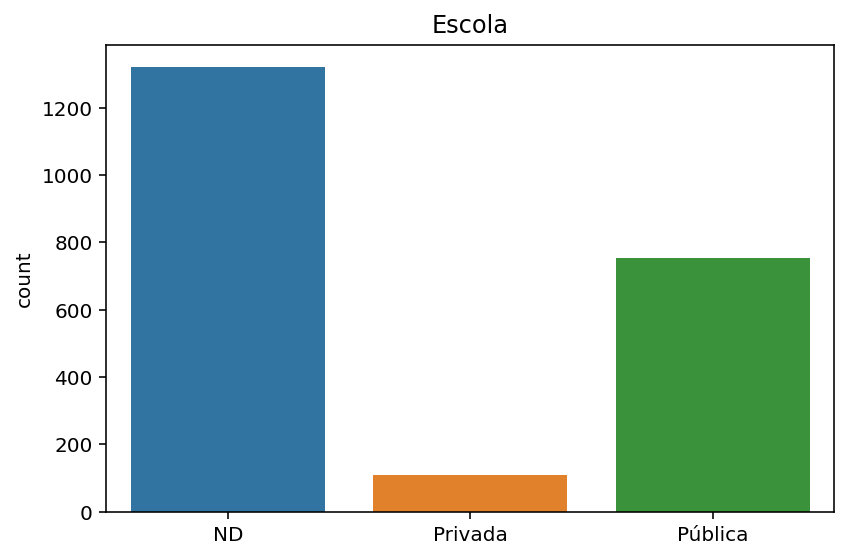

In [79]:
#frequência tipo de escola
sns.countplot(x='Escola', data=cluster2)
plt.xlabel('')
plt.title('Escola')
plt.tight_layout()
plt.show()

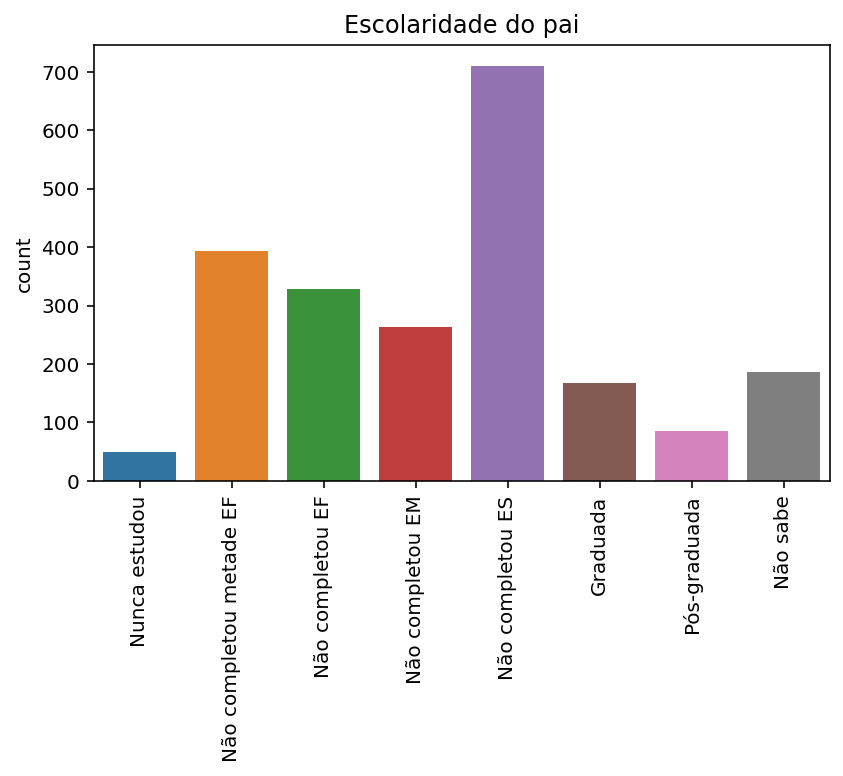

In [80]:
#frequência escolaridade do pai
sns.countplot(x='Escol_Pai', data=cluster2)
plt.title('Escolaridade do pai')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

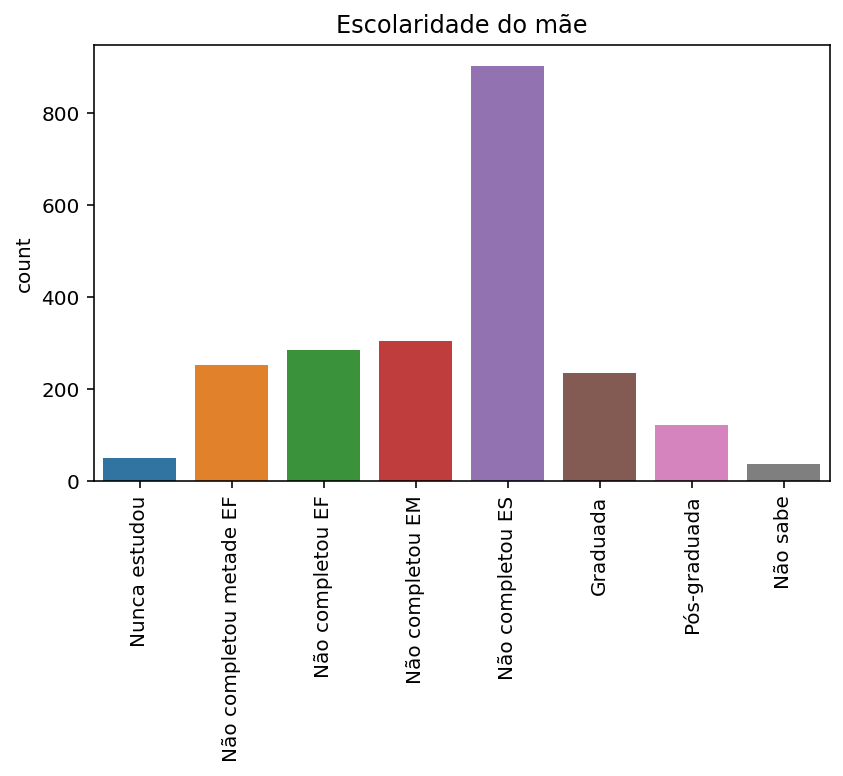

In [81]:
#frequência escolaridade da mãe
sns.countplot(x='Escol_Mãe', data=cluster2)
plt.title('Escolaridade do mãe')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

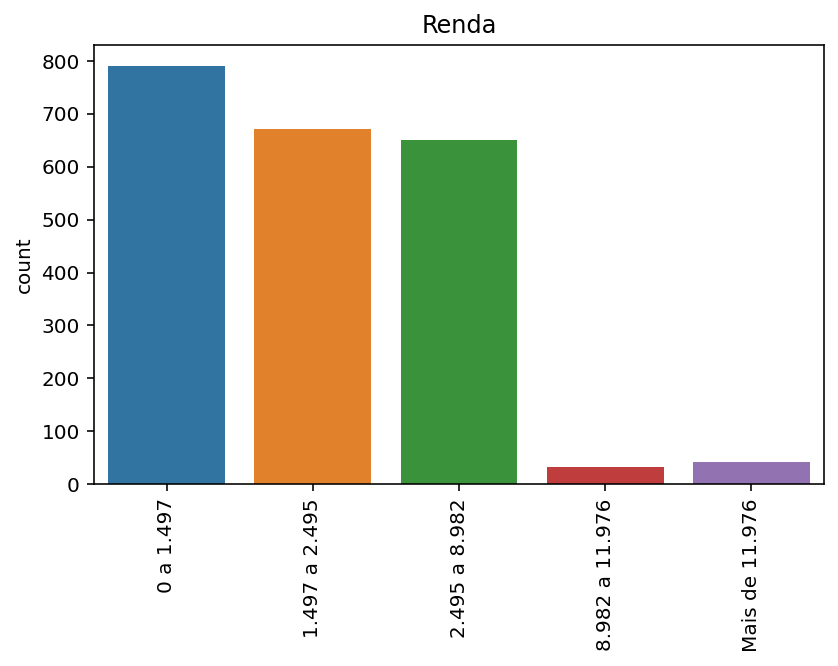

In [82]:
#frequência renda
sns.countplot(x='Renda', data=cluster2)
plt.title('Renda')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

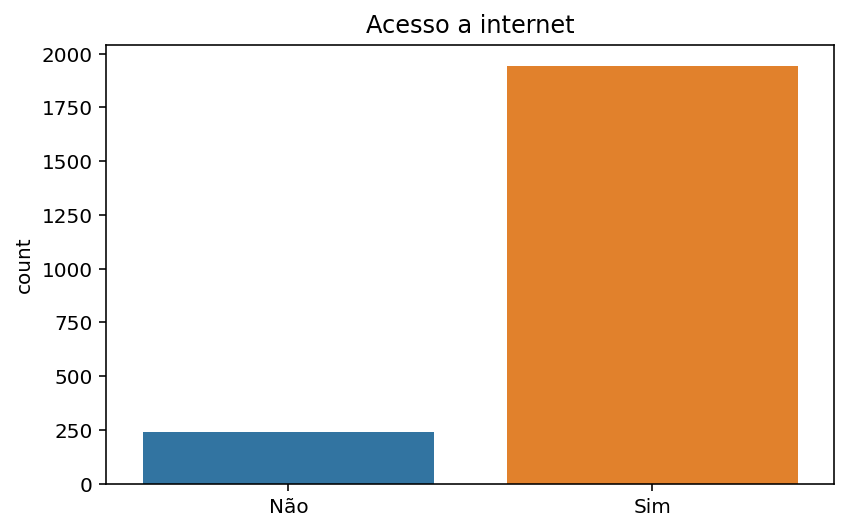

In [83]:
#frequência acesso internet
sns.countplot(x='Internet', data=cluster2)
plt.title('Acesso a internet')
plt.tight_layout()
plt.xlabel('')
plt.show()

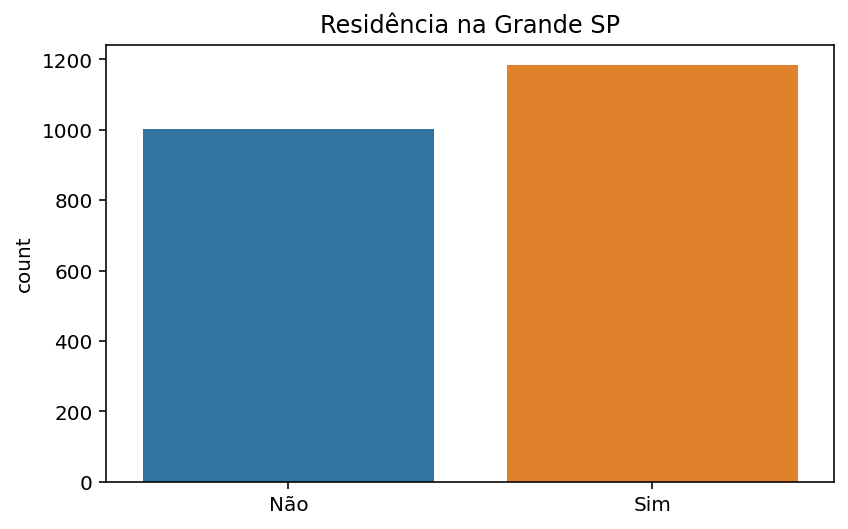

In [84]:
#frequência residência
sns.countplot(x='Grande_SP', data=cluster2)
plt.title('Residência na Grande SP')
plt.tight_layout()
plt.xlabel('')
plt.show()

#### Análise Multivariada

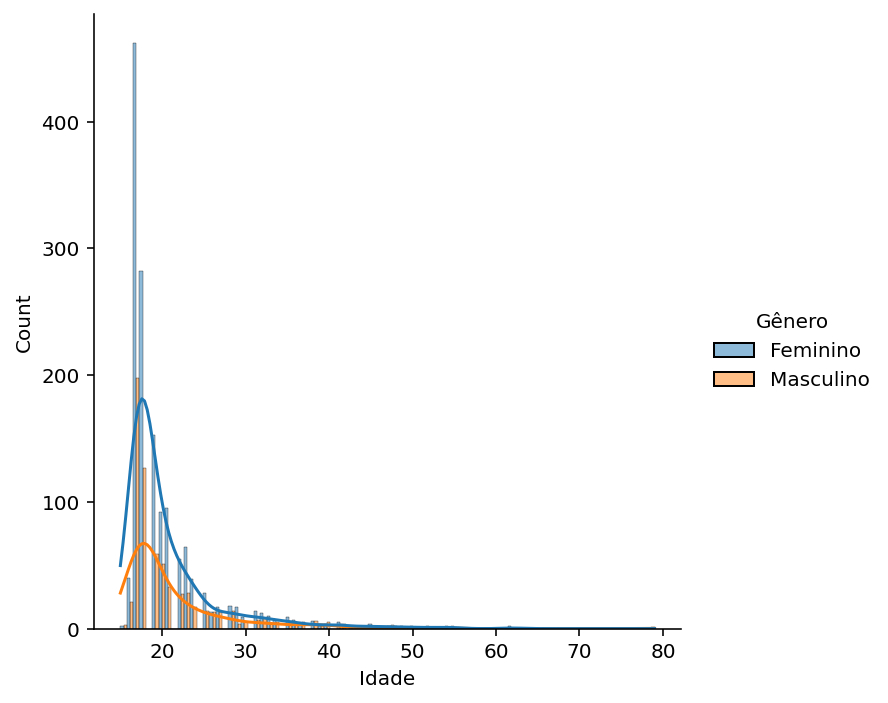

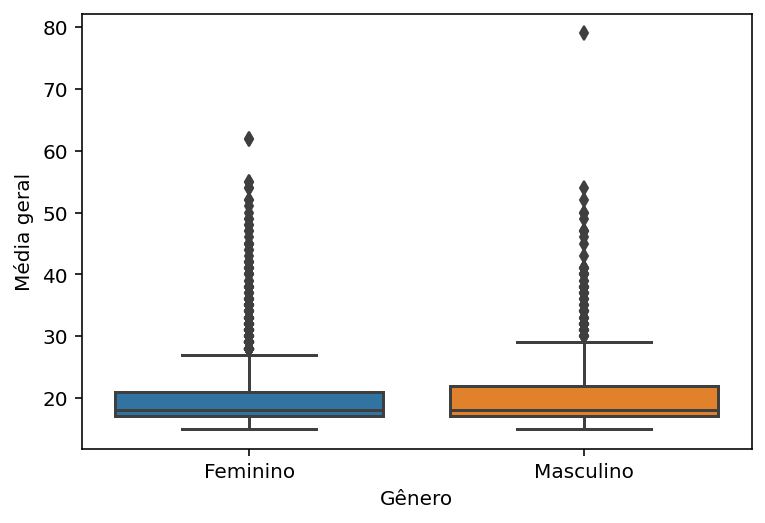

In [85]:
#distribuição da idade
sns.displot(cluster2, x='Idade', hue='Gênero', multiple='dodge', kde=True)
plt.show()

#boxplot
sns.boxplot(x='Gênero', y="Idade", data=cluster2)
plt.ylabel('Média geral')
plt.show()

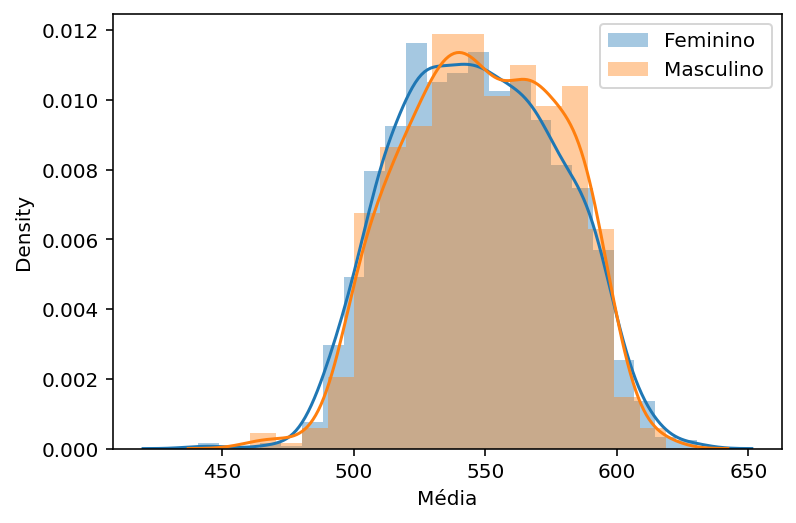

In [86]:
#histograma das notas
sns.distplot(cluster2[cluster2['Gênero'] == 'Feminino']['Média'], kde = True, label = 'Feminino')
sns.distplot(cluster2[cluster2['Gênero'] == 'Masculino']['Média'], kde = True, label = 'Masculino')
plt.xlabel('Média')
plt.legend()
plt.show()

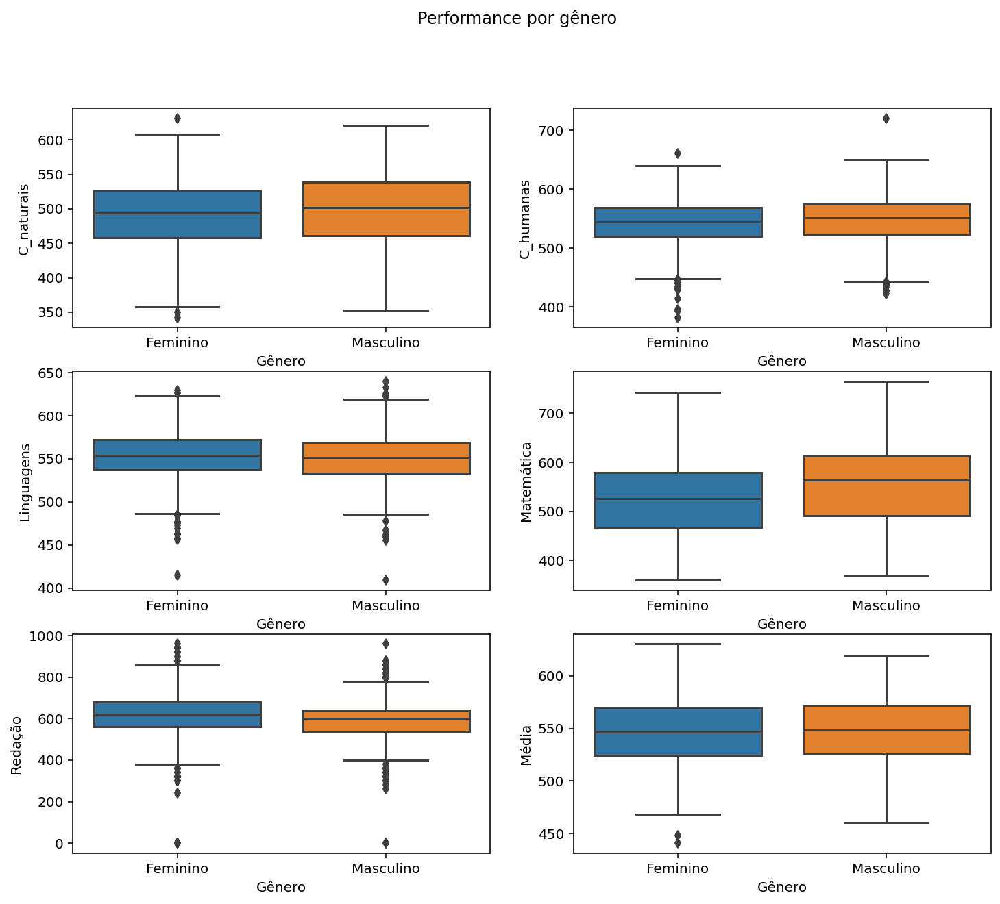

In [87]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle('Performance por gênero')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Gênero', y='C_naturais', data=cluster2)
#axes[0, 0].set_title('Nota ciências naturais')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Gênero', y='C_humanas', data=cluster2)
#axes[0, 1].set_title('Nota ciências humanas')
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Gênero', y='Linguagens', data=cluster2)
#axes[1, 0].set_title('Nota Linguagens')
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Gênero', y='Matemática', data=cluster2)
#axes[1, 1].set_title('Nota Matemática')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Gênero', y='Redação', data=cluster2)
#axes[2, 0].set_title('Nota Redação')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Gênero', y='Média', data=cluster2)
#axes[2, 1].set_title('Nota Média')
plt.show()

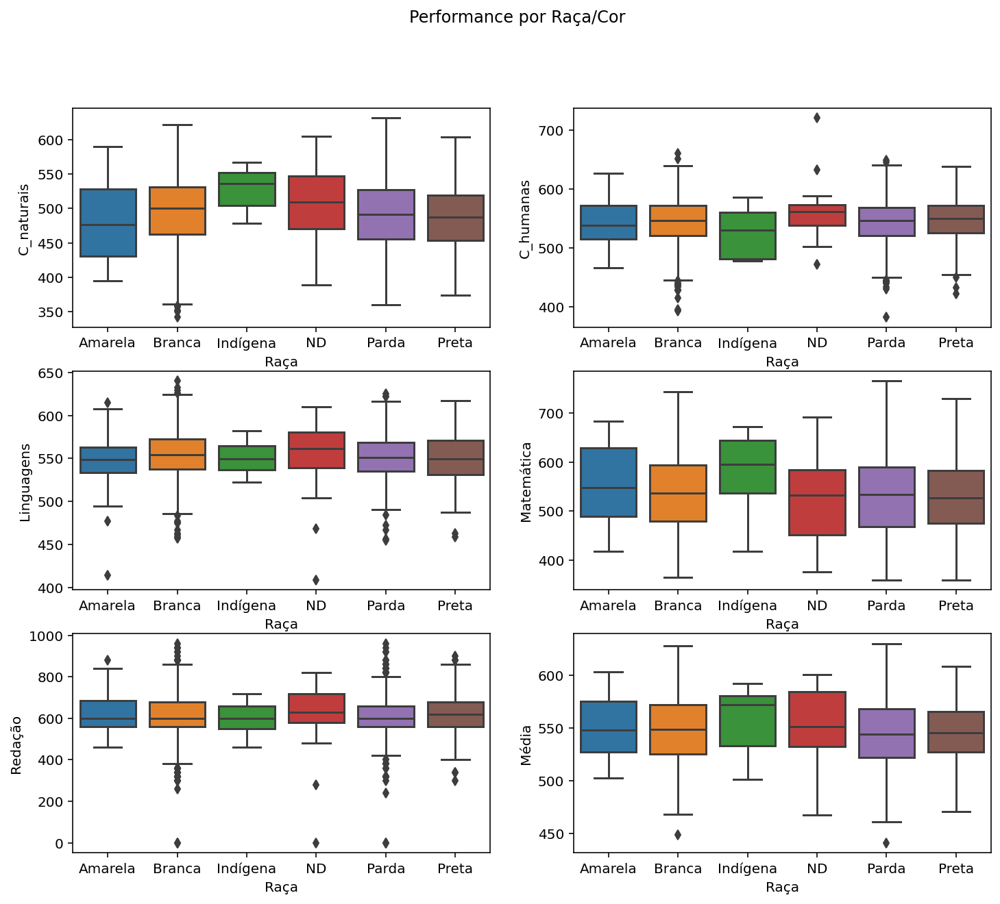

In [88]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle('Performance por Raça/Cor')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Raça', y='C_naturais', data=cluster2)
#axes[0, 0].set_title('Nota ciências naturais')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Raça', y='C_humanas', data=cluster2)
#axes[0, 1].set_title('Nota ciências humanas')
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Raça', y='Linguagens', data=cluster2)
#axes[1, 0].set_title('Nota Linguagens')
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Raça', y='Matemática', data=cluster2)
#axes[1, 1].set_title('Nota Matemática')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Raça', y='Redação', data=cluster2)
#axes[2, 0].set_title('Nota Redação')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Raça', y='Média', data=cluster2)
#axes[2, 1].set_title('Nota Média')
plt.show()

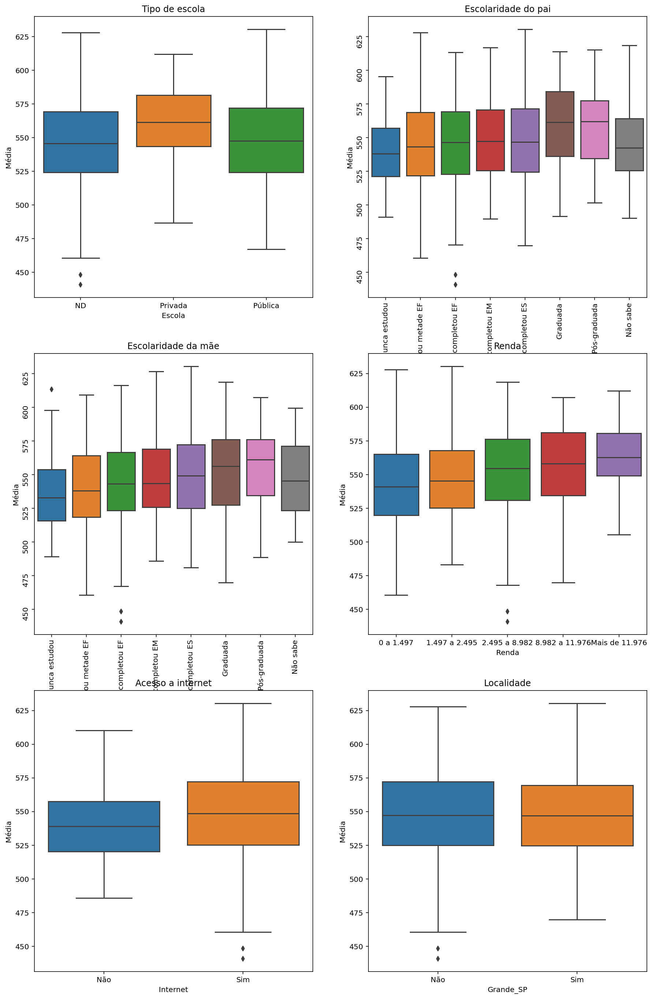

In [89]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(15, 24))
#fig.suptitle('Performance geral por categoria')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Escola', y='Média', data=cluster2)
axes[0, 0].set_title('Tipo de escola')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Escol_Pai', y='Média', data=cluster2)
axes[0, 1].set_title('Escolaridade do pai')
axes[0, 1].tick_params(labelrotation=90)
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Escol_Mãe', y='Média', data=cluster2)
axes[1, 0].set_title('Escolaridade da mãe')
axes[1, 0].tick_params(labelrotation=90)
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Renda', y='Média', data=cluster2)
axes[1, 1].set_title('Renda')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Internet', y='Média', data=cluster2)
axes[2, 0].set_title('Acesso a internet')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Grande_SP', y='Média', data=cluster2)
axes[2, 1].set_title('Localidade')

plt.show()

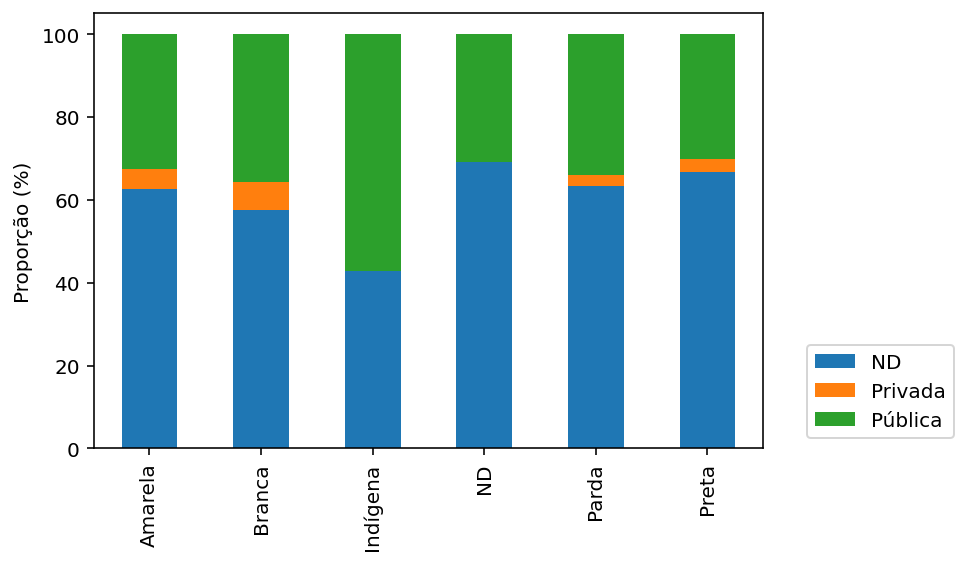

In [90]:
#porporção escola x raça neste cluster
ct = pd.crosstab(cluster2['Raça'],
                 cluster2['Escola'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

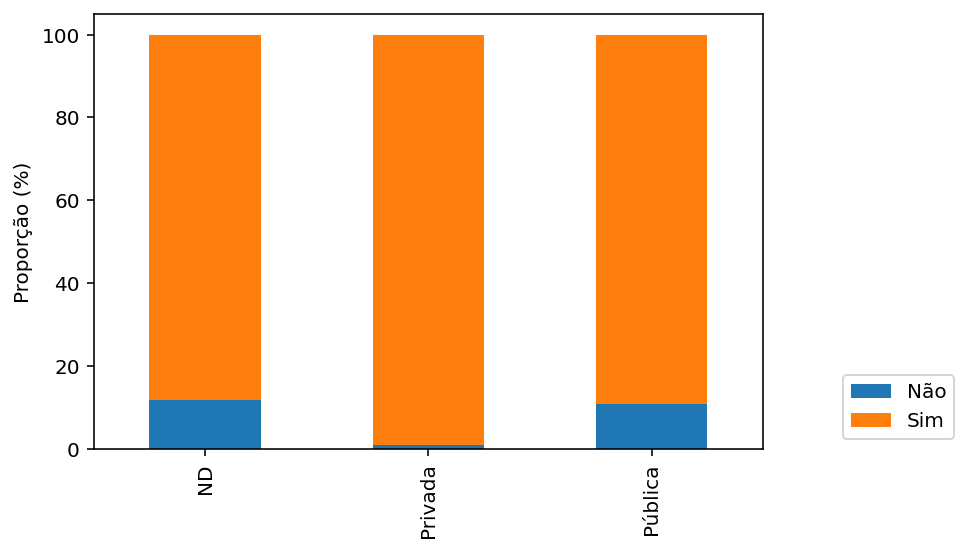

In [91]:
#porporção gênero x escola neste cluster
ct = pd.crosstab(cluster2['Escola'],
                 cluster2['Internet'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

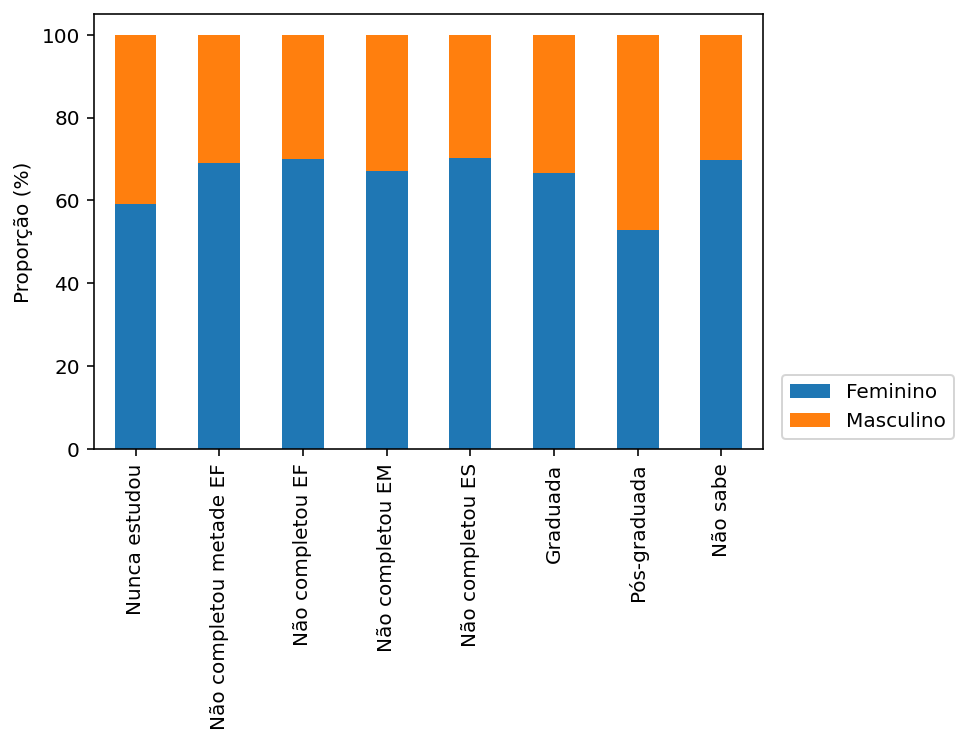

In [92]:
#porporção gênero x escolaridade do pai neste cluster
ct = pd.crosstab(cluster2['Escol_Pai'],
                 cluster2['Gênero'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

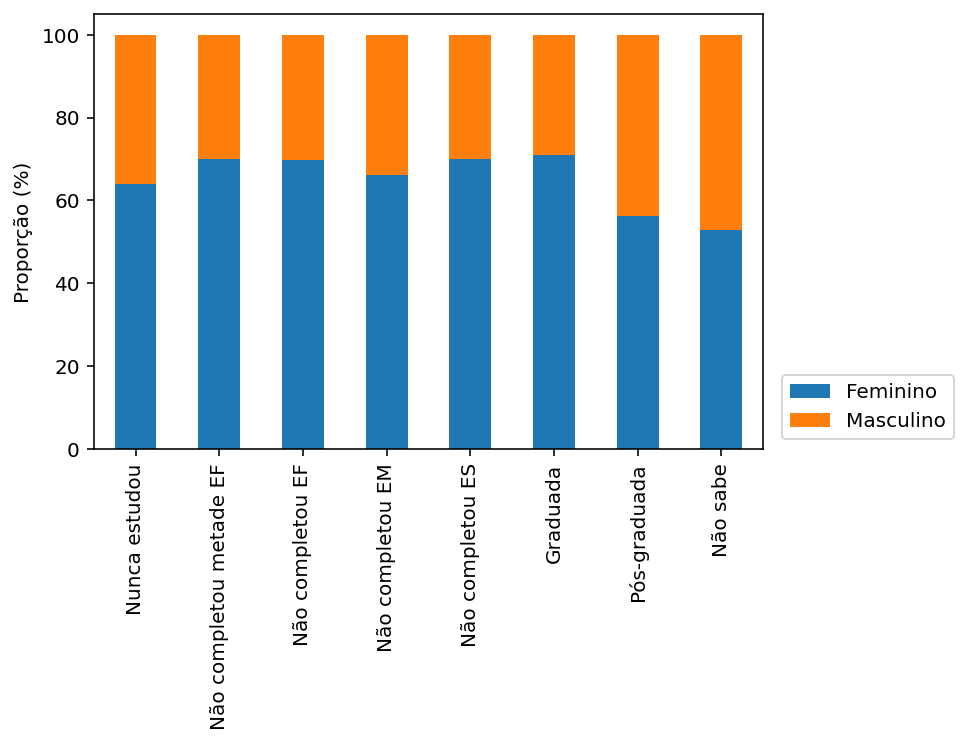

In [93]:
#porporção gênero x escolaridade da mãe neste cluster
ct = pd.crosstab(cluster2['Escol_Mãe'],
                 cluster2['Gênero'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

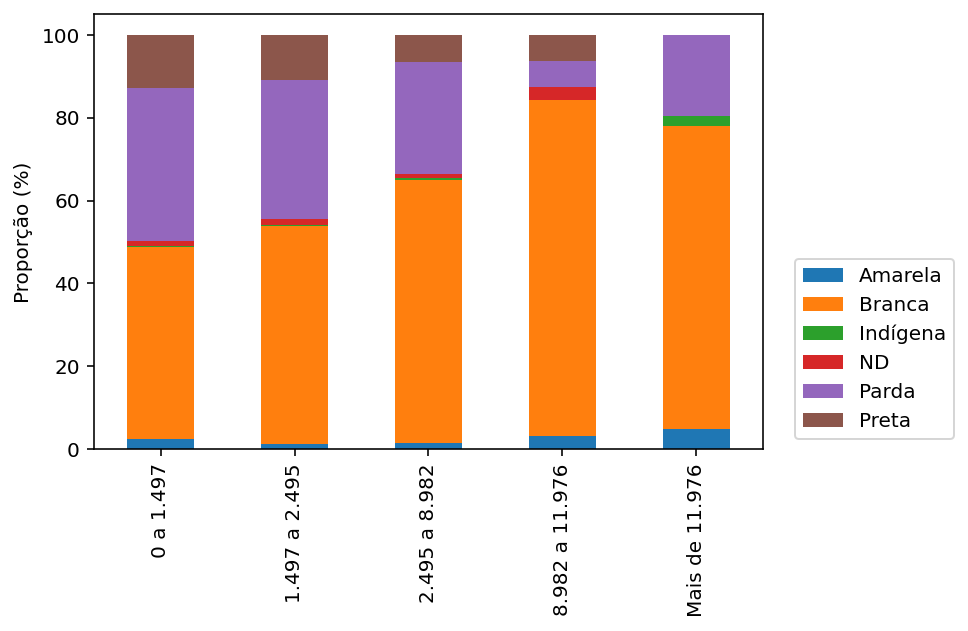

In [94]:
#porporção raça x renda neste cluster
ct = pd.crosstab(cluster2['Renda'],
                 cluster2['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

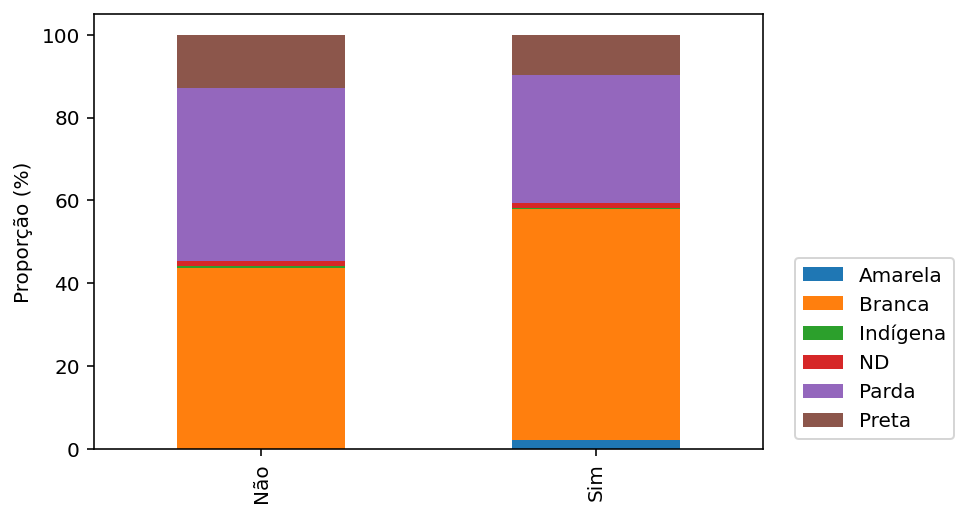

In [95]:
#porporção raça x internet neste cluster
ct = pd.crosstab(cluster2['Internet'],
                 cluster2['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

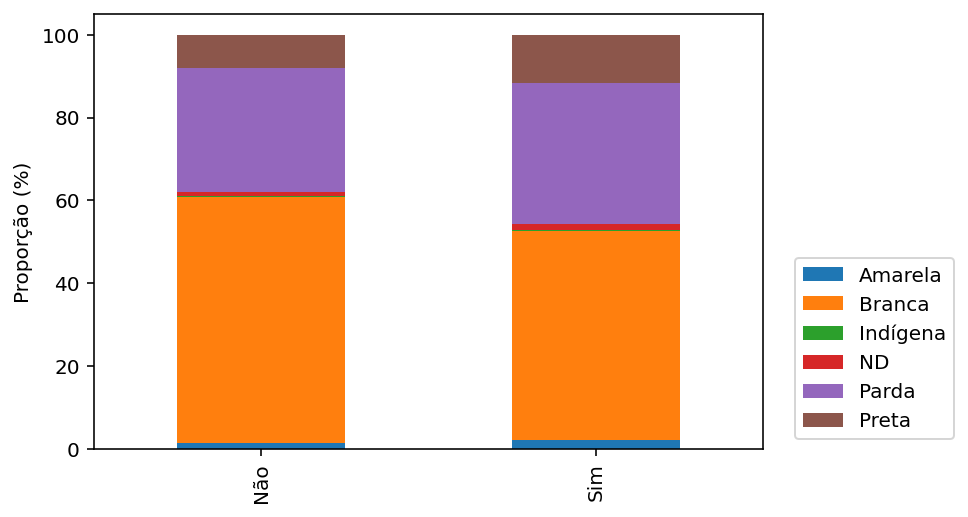

In [96]:
#porporção raça x localidade neste cluster
ct = pd.crosstab(cluster2['Grande_SP'],
                 cluster2['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

#### Conclusões Cluster 2

- Média de idade dos candidatos é de ~21 anos;
- Dobro de mulheres em relação a presença masculina;
- Predominância de pessoas que se autodeclaram brancas, seguido de negros/pardos e por fim podemos notar a presença de indígenas;
- De novo maioria não declarou em qual escola estudou.
- Para maioria dos candidatos os pais não completaram o ensino superior; agora temos uma maior presença de grupos que os pais não possuem grau de escolaridade alto;
- Seguindo ranking da FGV, *classe E* possui maior presença neste grupo, seguido de perto pelas classes D e C;
- Maioria esmagadora possui acesso a internet;
- Levando em consideração a media, homens e mulheres possuem um desempenho parecido;
- Destaque para o desempenho elevado dos indígenas em relação aos outros grupos em ciências naturais e matemática;

### Cluster 1

Os candidatos paulistas medalha de bronze são:

In [97]:
#resumo das notas
cluster1 = enem_melhores[enem_melhores['Clusters']  == 1]
cluster1.describe().round(2)

,Idade,C_naturais,C_humanas,Linguagens,Matemática,Redação,Média
count,1565.00,1565.00,1565.00,1565.00,1565.00,1565.00,1565.00
mean,21.42,426.01,458.80,490.03,456.74,478.40,462.00
std,6.93,45.57,51.23,42.91,60.35,141.62,36.04
min,15.00,329.60,0.00,325.70,359.00,0.00,312.72
25%,17.00,393.90,423.40,470.00,409.50,420.00,441.98
50%,18.00,421.10,462.10,498.40,446.50,500.00,468.48
75%,23.00,455.40,496.90,519.00,493.20,560.00,487.00
max,65.00,618.70,596.90,586.00,696.60,900.00,568.98


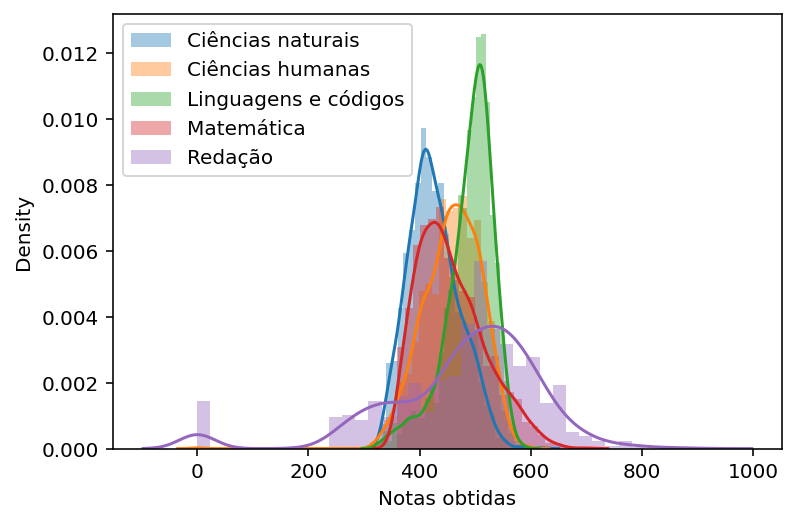

In [98]:
#histograma das notas
sns.distplot(cluster1['C_naturais'], kde = True, label='Ciências naturais')
sns.distplot(cluster1['C_humanas'], kde = True, label='Ciências humanas')
sns.distplot(cluster1['Linguagens'], kde = True, label='Linguagens e códigos')
sns.distplot(cluster1['Matemática'], kde = True, label='Matemática')
sns.distplot(cluster1['Redação'], kde = True, label='Redação')
plt.xlabel('Notas obtidas')
plt.legend()
plt.show()

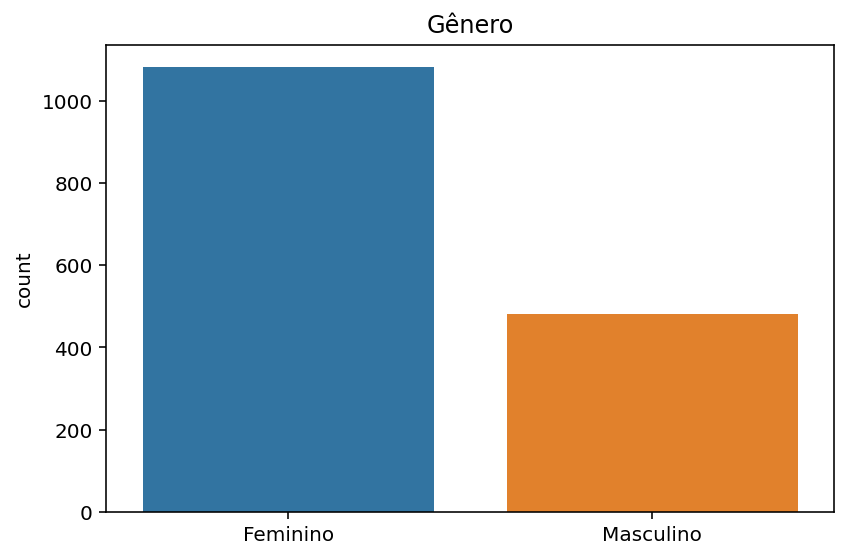

In [99]:
#frequência gênero
sns.countplot(x='Gênero', data=cluster1)
plt.xlabel('')
plt.title('Gênero')
plt.tight_layout()
plt.show()

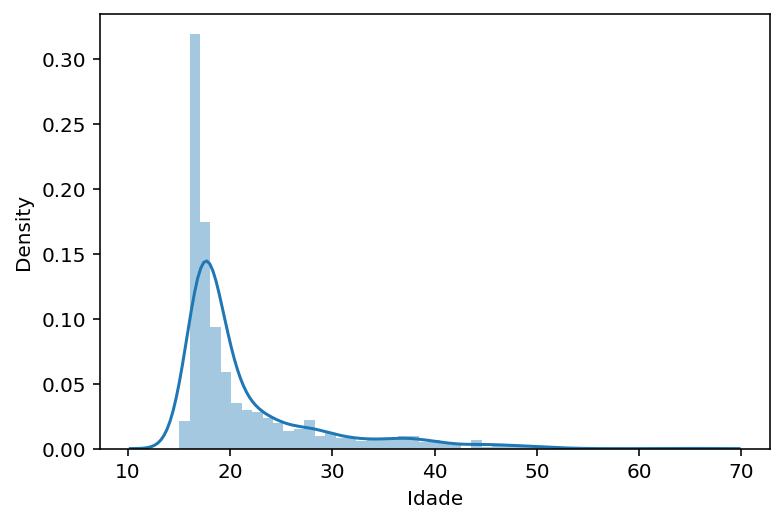

In [100]:
#histograma
sns.distplot(cluster1['Idade'], kde = True)
plt.xlabel('Idade')
plt.show()

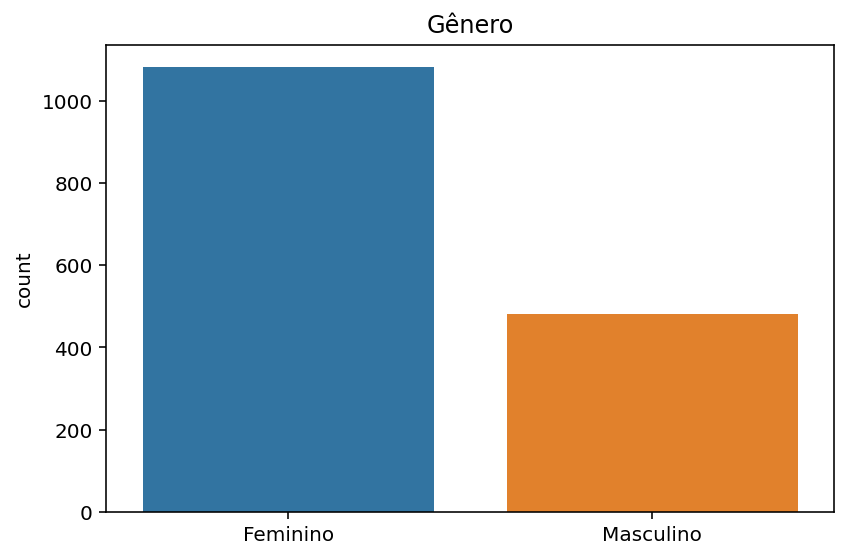

In [101]:
#frequência gênero
sns.countplot(x='Gênero', data=cluster1)
plt.xlabel('')
plt.title('Gênero')
plt.tight_layout()
plt.show()

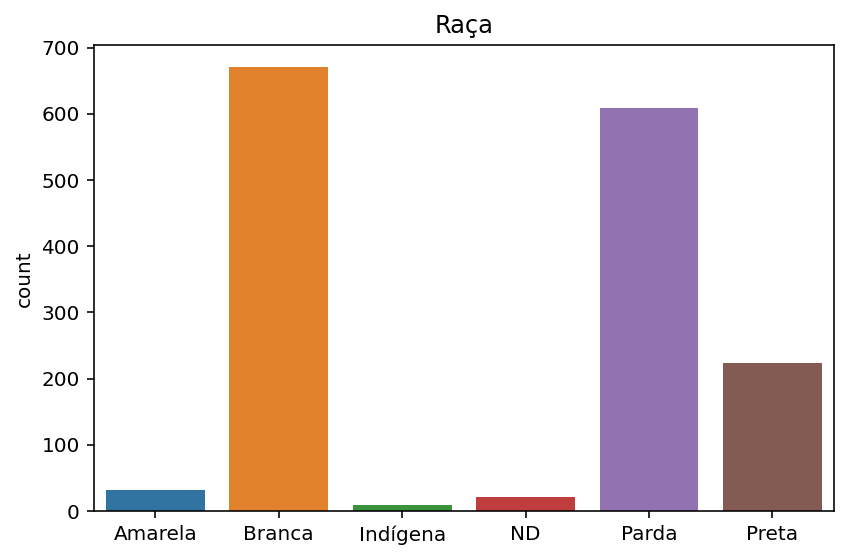

In [102]:
#frequência raça
sns.countplot(x='Raça', data=cluster1)
plt.xlabel('')
plt.title('Raça')
plt.tight_layout()
plt.show()

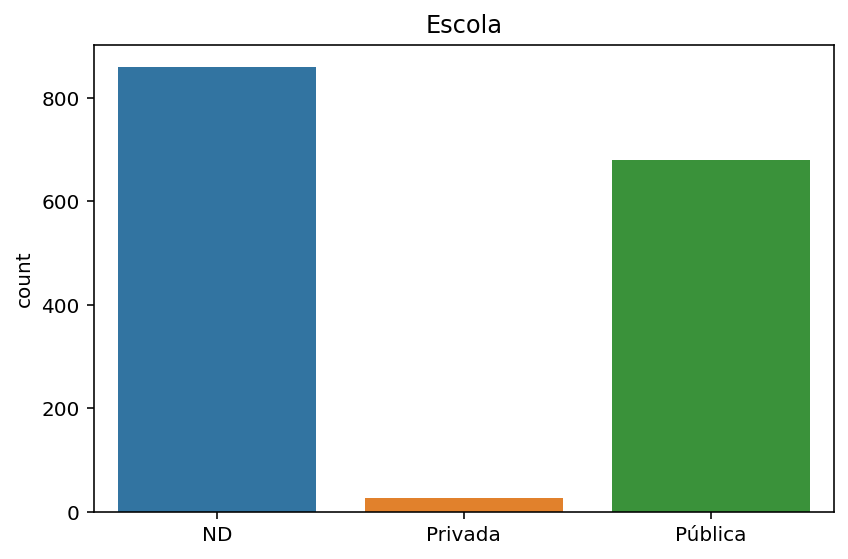

In [103]:
#frequência tipo de escola
sns.countplot(x='Escola', data=cluster1)
plt.xlabel('')
plt.title('Escola')
plt.tight_layout()
plt.show()

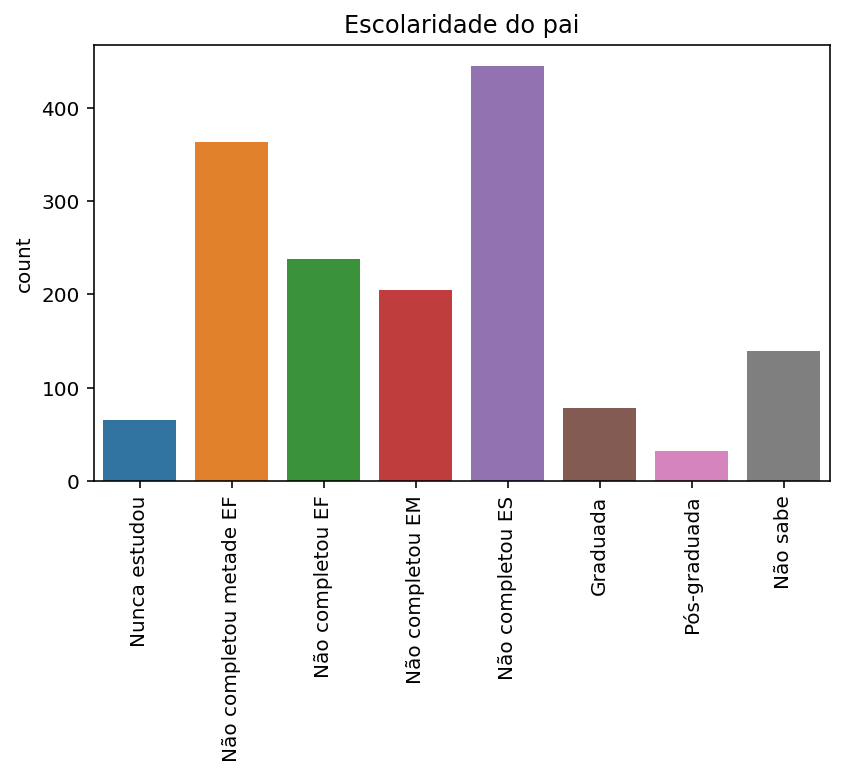

In [104]:
1#frequência escolaridade do pai
sns.countplot(x='Escol_Pai', data=cluster1)
plt.title('Escolaridade do pai')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

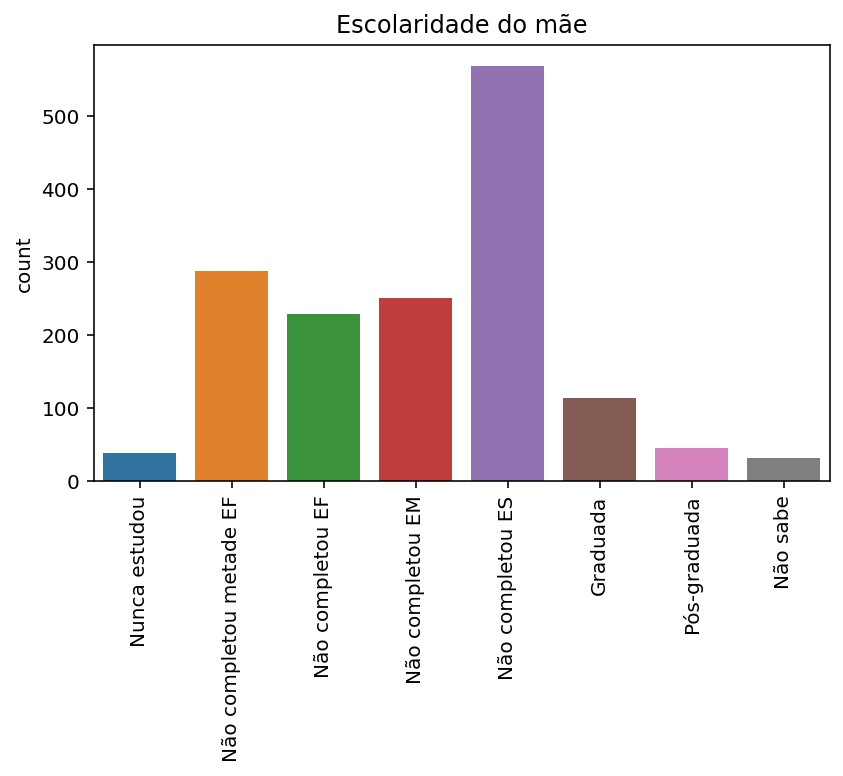

In [105]:
#frequência escolaridade da mãe
sns.countplot(x='Escol_Mãe', data=cluster1)
plt.title('Escolaridade do mãe')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

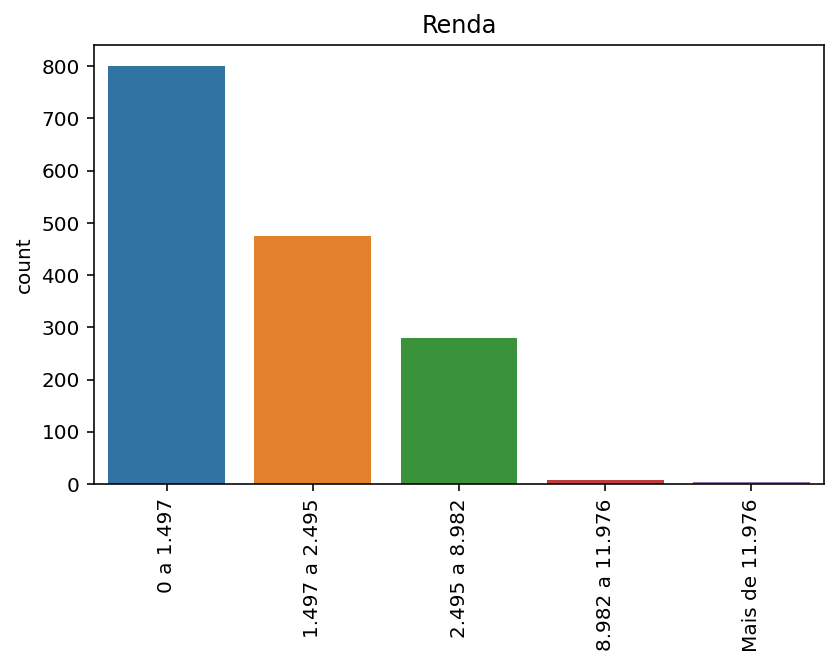

In [106]:
#frequência renda
sns.countplot(x='Renda', data=cluster1)
plt.title('Renda')
plt.tight_layout()
plt.xlabel('')
plt.xticks(rotation=90)
plt.show()

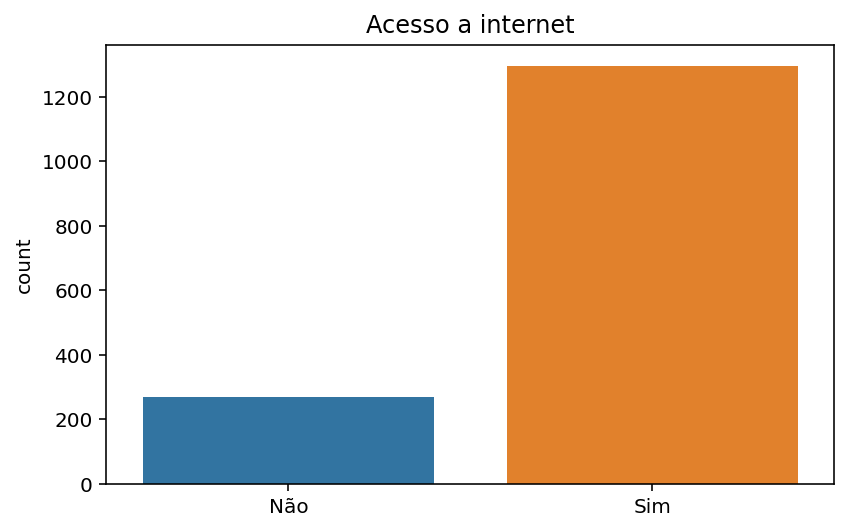

In [107]:
#frequência acesso internet
sns.countplot(x='Internet', data=cluster1)
plt.title('Acesso a internet')
plt.tight_layout()
plt.xlabel('')
plt.show()

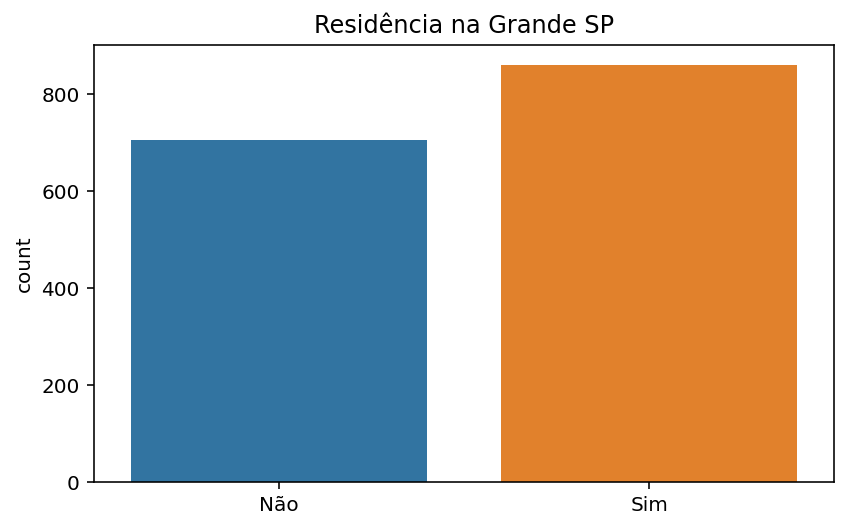

In [108]:
#frequência residência
sns.countplot(x='Grande_SP', data=cluster1)
plt.title('Residência na Grande SP')
plt.tight_layout()
plt.xlabel('')
plt.show()

#### Análise Multivariada

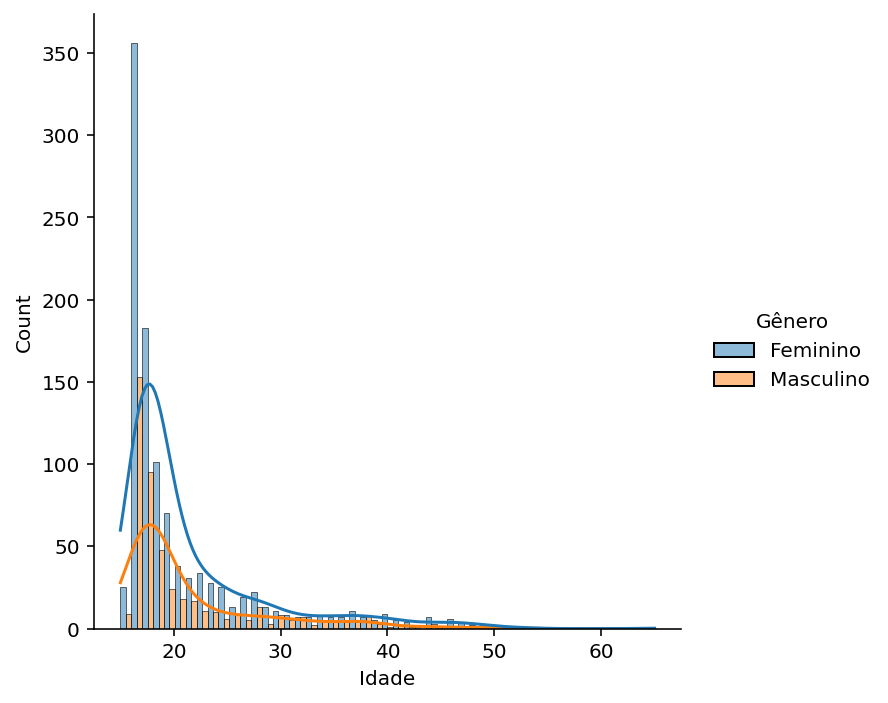

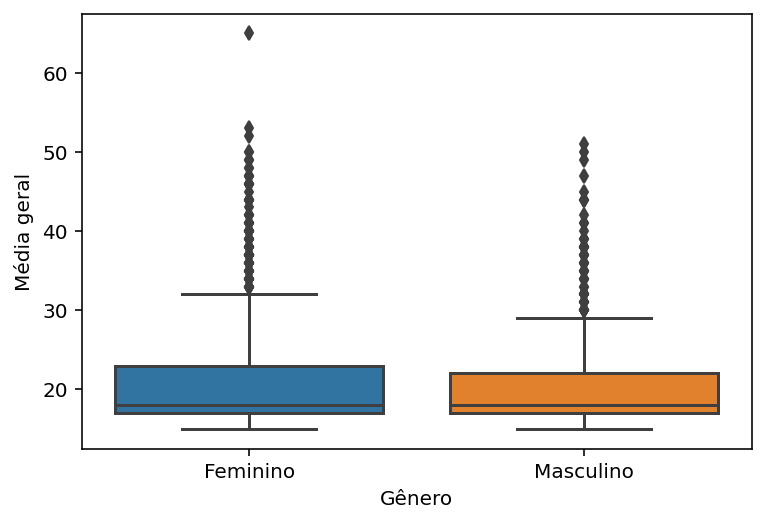

In [109]:
#distribuição da idade
sns.displot(cluster1, x='Idade', hue='Gênero', multiple='dodge', kde=True)
plt.show()

#boxplot
sns.boxplot(x='Gênero', y="Idade", data=cluster1)
plt.ylabel('Média geral')
plt.show()

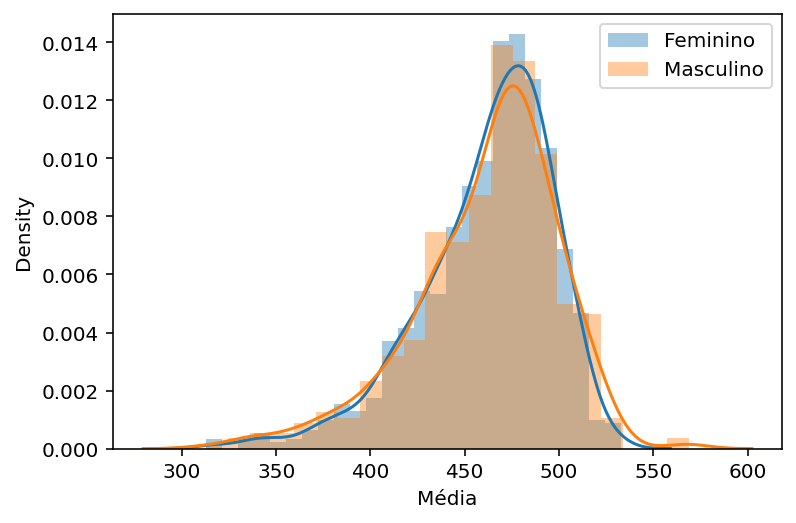

In [110]:
#histograma das notas
sns.distplot(cluster1[cluster1['Gênero'] == 'Feminino']['Média'], kde = True, label = 'Feminino')
sns.distplot(cluster1[cluster1['Gênero'] == 'Masculino']['Média'], kde = True, label = 'Masculino')
plt.xlabel('Média')
plt.legend()
plt.show()

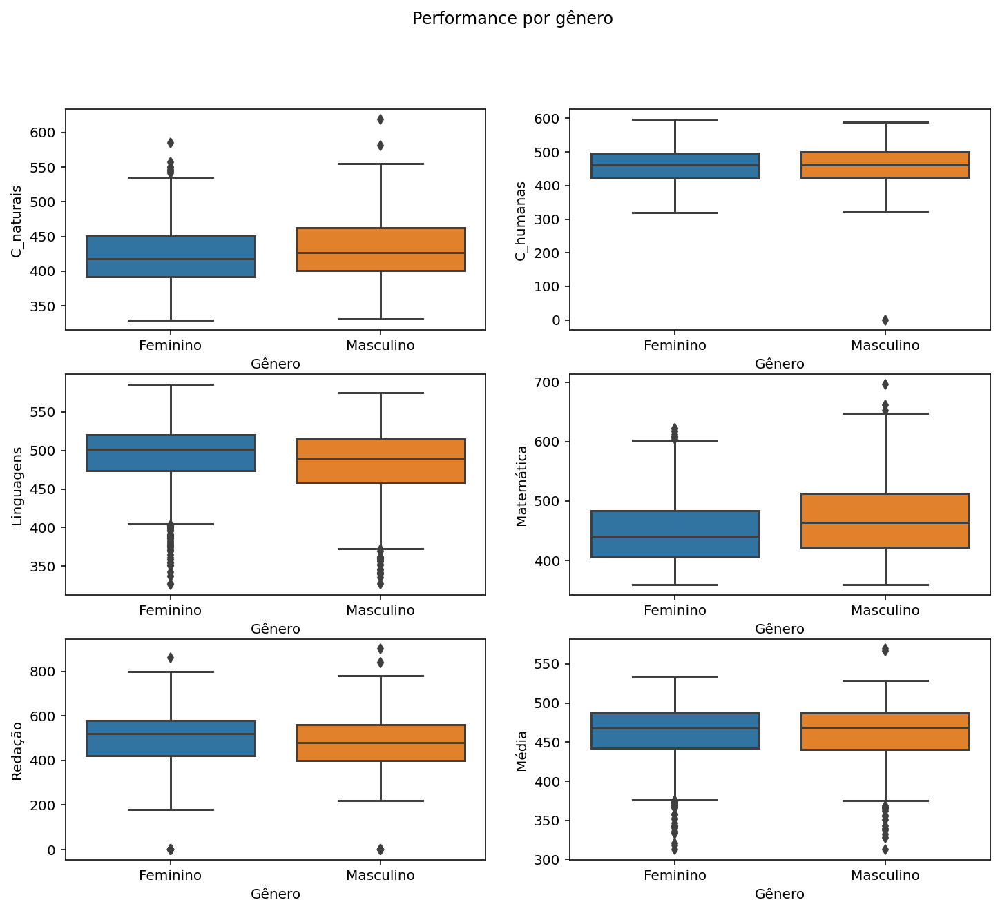

In [111]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle('Performance por gênero')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Gênero', y='C_naturais', data=cluster1)
#axes[0, 0].set_title('Nota ciências naturais')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Gênero', y='C_humanas', data=cluster1)
#axes[0, 1].set_title('Nota ciências humanas')
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Gênero', y='Linguagens', data=cluster1)
#axes[1, 0].set_title('Nota Linguagens')
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Gênero', y='Matemática', data=cluster1)
#axes[1, 1].set_title('Nota Matemática')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Gênero', y='Redação', data=cluster1)
#axes[2, 0].set_title('Nota Redação')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Gênero', y='Média', data=cluster1)
#axes[2, 1].set_title('Nota Média')
plt.show()

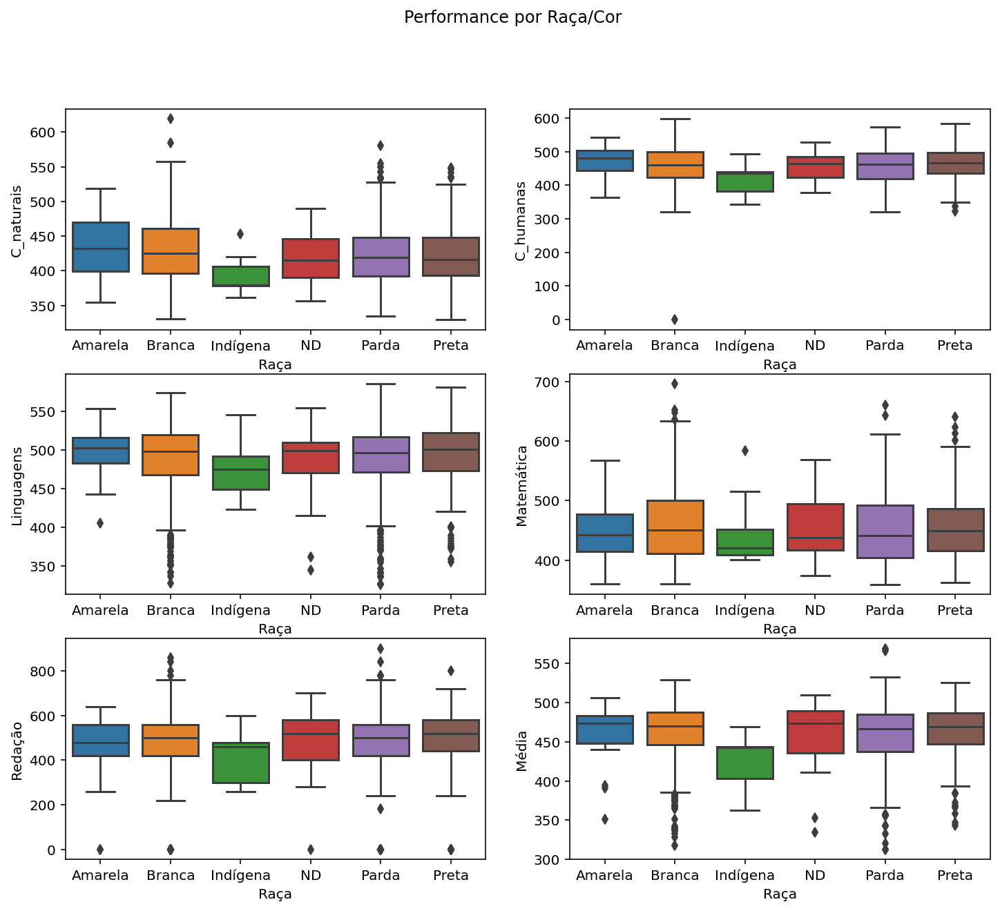

In [112]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle('Performance por Raça/Cor')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Raça', y='C_naturais', data=cluster1)
#axes[0, 0].set_title('Nota ciências naturais')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Raça', y='C_humanas', data=cluster1)
#axes[0, 1].set_title('Nota ciências humanas')
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Raça', y='Linguagens', data=cluster1)
#axes[1, 0].set_title('Nota Linguagens')
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Raça', y='Matemática', data=cluster1)
#axes[1, 1].set_title('Nota Matemática')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Raça', y='Redação', data=cluster1)
#axes[2, 0].set_title('Nota Redação')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Raça', y='Média', data=cluster1)
#axes[2, 1].set_title('Nota Média')
plt.show()

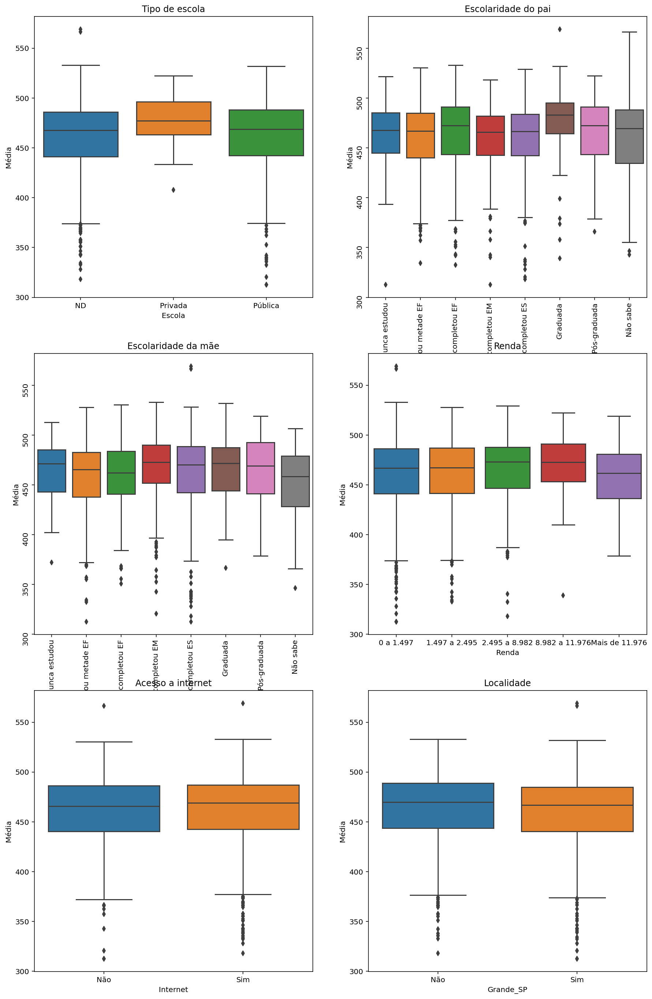

In [113]:
#prepara o grid
fig, axes = plt.subplots(3, 2, figsize=(15, 24))
#fig.suptitle('Performance geral por categoria')
# primeiro gráfico
sns.boxplot(ax=axes[0, 0], x='Escola', y='Média', data=cluster1)
axes[0, 0].set_title('Tipo de escola')
# segundo gráfico
sns.boxplot(ax=axes[0, 1], x='Escol_Pai', y='Média', data=cluster1)
axes[0, 1].set_title('Escolaridade do pai')
axes[0, 1].tick_params(labelrotation=90)
# terceiro gráfico
sns.boxplot(ax=axes[1, 0], x='Escol_Mãe', y='Média', data=cluster1)
axes[1, 0].set_title('Escolaridade da mãe')
axes[1, 0].tick_params(labelrotation=90)
#quarto gráfico
sns.boxplot(ax=axes[1, 1], x='Renda', y='Média', data=cluster1)
axes[1, 1].set_title('Renda')
# quinto gráfico
sns.boxplot(ax=axes[2, 0], x='Internet', y='Média', data=cluster1)
axes[2, 0].set_title('Acesso a internet')
# sexto gráfico
sns.boxplot(ax=axes[2, 1], x='Grande_SP', y='Média', data=cluster1)
axes[2, 1].set_title('Localidade')

plt.show()

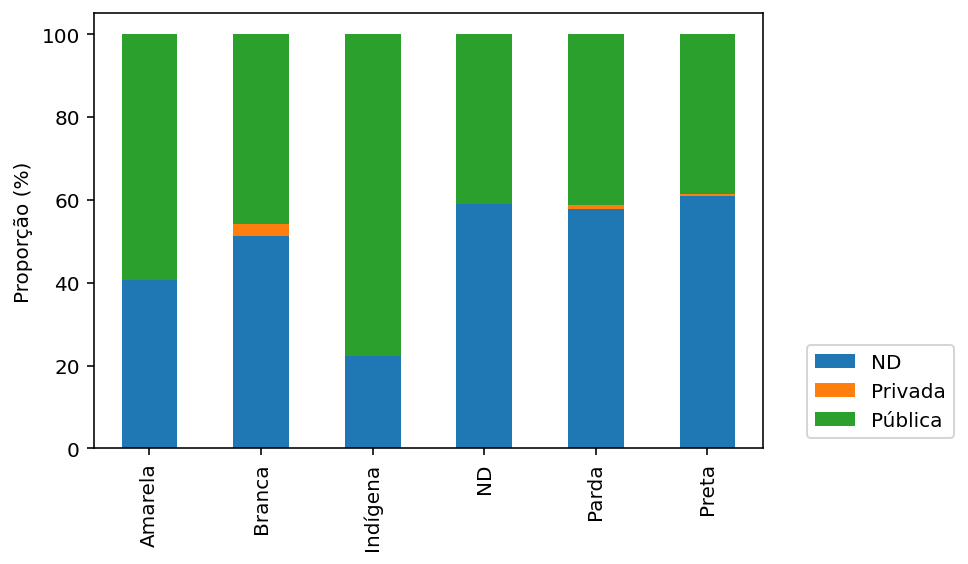

In [114]:
#porporção escola x raça neste cluster
ct = pd.crosstab(cluster1['Raça'],
                 cluster1['Escola'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

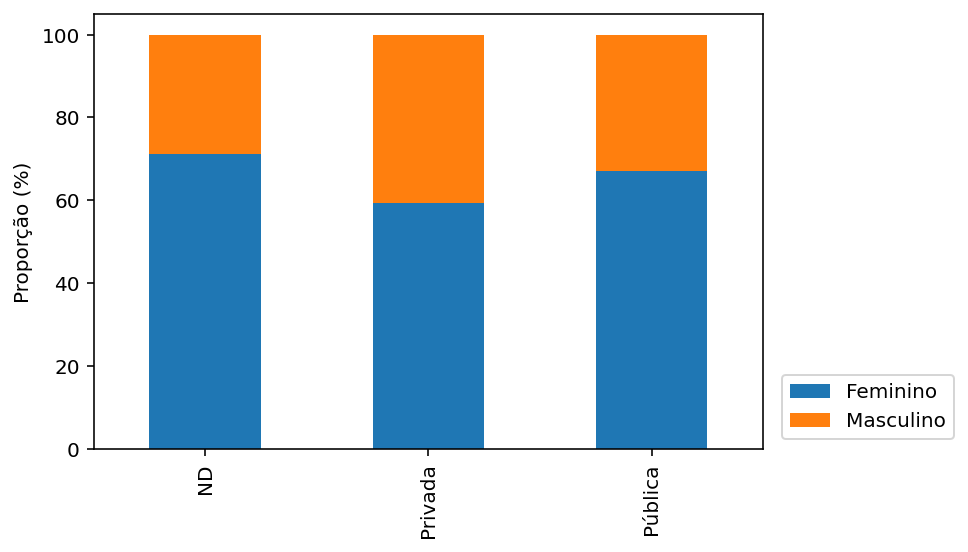

In [115]:
#porporção gênero x escola neste cluster
ct = pd.crosstab(cluster1['Escola'],
                 cluster1['Gênero'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

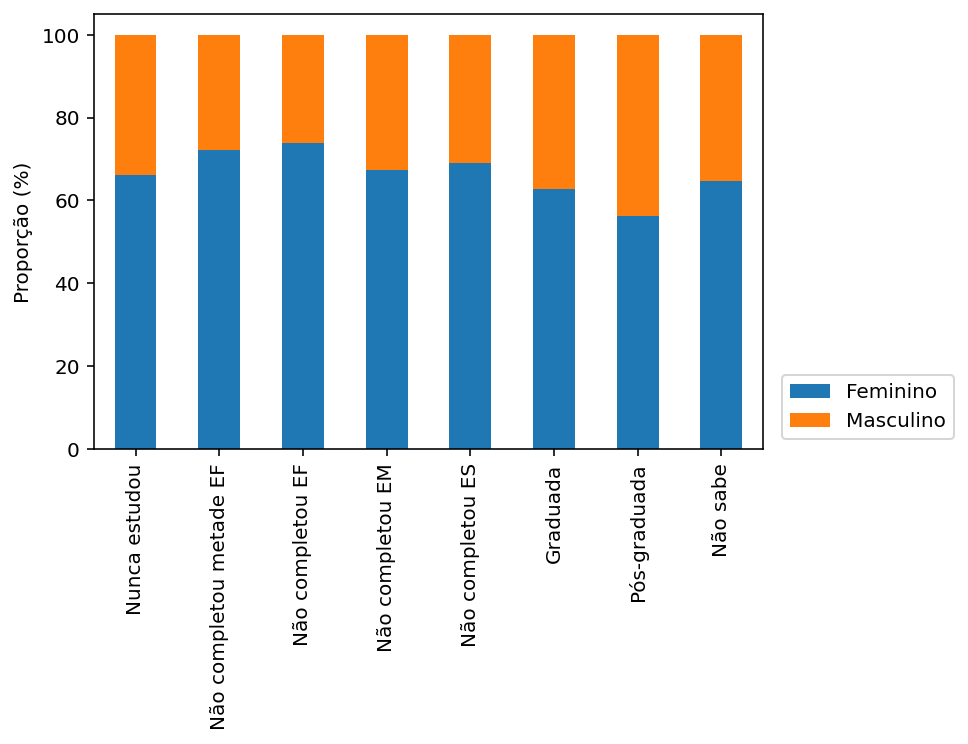

In [116]:
#porporção gênero x escolaridade do pai neste cluster
ct = pd.crosstab(cluster1['Escol_Pai'],
                 cluster1['Gênero'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

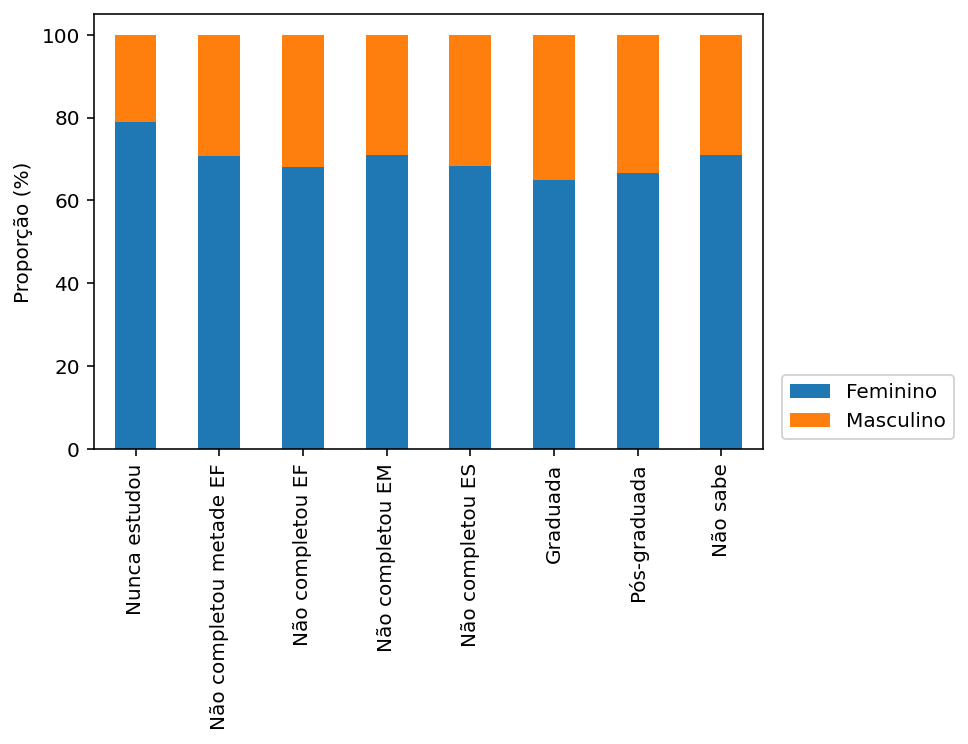

In [117]:
#porporção gênero x escolaridade da mãe neste cluster
ct = pd.crosstab(cluster1['Escol_Mãe'],
                 cluster1['Gênero'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

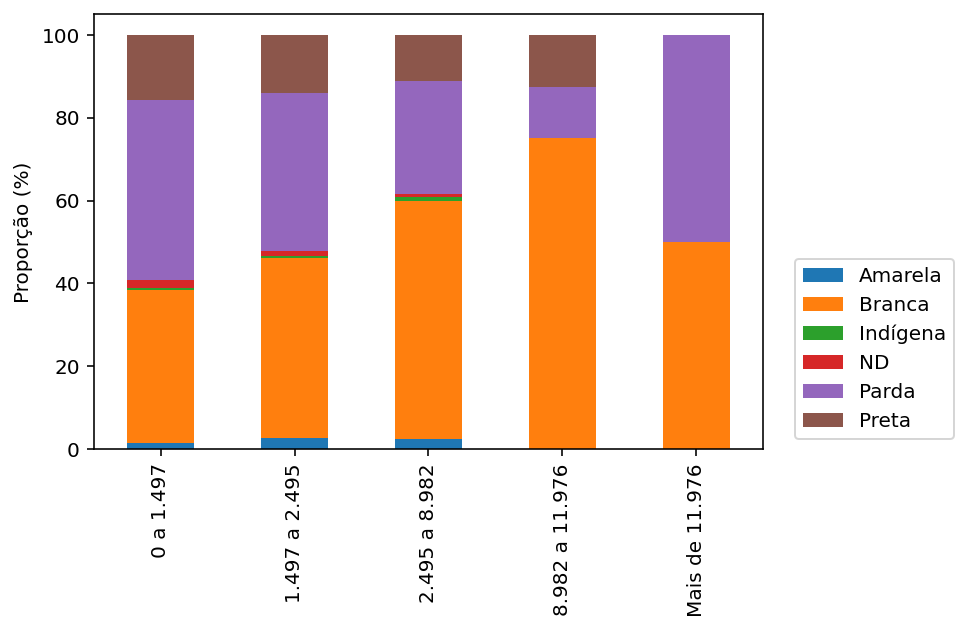

In [118]:
#porporção raça x renda neste cluster
ct = pd.crosstab(cluster1['Renda'],
                 cluster1['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

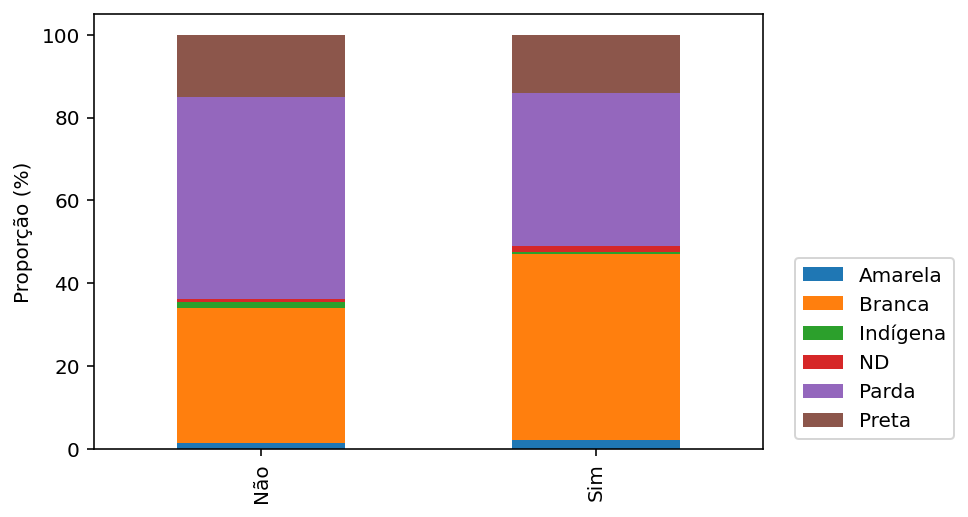

In [119]:
#porporção raça x internet neste cluster
ct = pd.crosstab(cluster1['Internet'],
                 cluster1['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

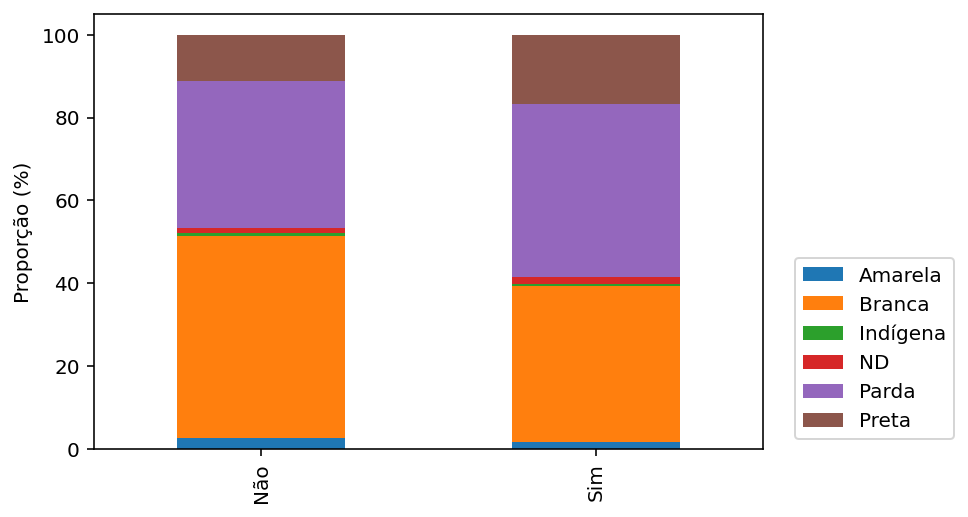

In [120]:
#porporção raça x localidade neste cluster
ct = pd.crosstab(cluster1['Grande_SP'],
                 cluster1['Raça'],
                 normalize = 'index')*100
ct.round(2)

#plota a informação
ct.plot.bar(stacked=True)
plt.xlabel('')
plt.ylabel('Proporção (%)')
plt.legend(bbox_to_anchor=(1.3, 0), loc='lower right', ncol=1)
plt.show()

#### Conclusões Cluster 1

- Média de idade dos candidatos é de ~21 anos;
- Novamente a maioria é de mulheres;
- Equilibrio entre a presença de brancos e pardos/negros neste grupo;
- Mesmas características de escolaridade dos pais em relação ao Cluster anterior;
- Maior quantidade de pessoas pertencentes a *Classe E*;
- Todas as raças/cor possuem um desempenho parecido, exceto pelos indígenas que possuem uma performance um pouco inferior;
- Neste grupo a renda não possui grande influência na média final, exceto pra *Classe A* que ficou um pouco atrás, vale uma investigação mais a fundo;
- Alunos de escola privada continuam com o melhor desempenho.

## Conclusões gerais

Apesar da falta de testes estatísticos:

- Tendência dos homens irem melhor em matemática e mulheres irem bem na redação;
- É possível notar que quanto maior a escolaridade dos pais e renda (estudos sociais indicam que são variáveis relacionadas) melhor o desempenho do candidato.
- O acesso a internet possui um impacto positivo no desempenho do candidato;
- Candidatos advindos de escolas particulares possuem um melhor desempenho em relação aos advindos de escolas públicas, apesar dos alunos de escolas públicas marcarem maior presença (dado que possuem mais alunos matriculados em escolas públicas);
- Não é novidade, mas através da nossa análise é possível visulalizar que os pretos/pardos não são tão presentes nas *classes A* e *B*, e por consequência frequentam menos escolas particulares, possuem menos acesso a internet, que como vimos, são fatores cruciais para um bom desempenho no enem, tudo isso comparado aos brancos que - das raças/cor declaradas - possuem o melhor desempenho.

## Próximos passos

- Realizar teste de hipóteses para confirmar estatísticamente os questionamentos levantados nos itens anteriores;
- Investigar se esses padrões se repetem no Brasil e/ou outros estados.

## FIM

Nossa primeira análise nos microdados do Enem 2019 chegou ao fim, espero nos vermos por aí.

![obrigado.gif](https://media.giphy.com/media/tjuWJTevYz1Oo/giphy.gif)